In [3]:
import sys
sys.path.append("/SemSeg/keras")
sys.path.append("/SemSeg/multimodal_keras_wrapper")
sys.path.append("/SemSeg/keras_semantic_segmentation")
from keras.models import load_model
from numpy import expand_dims
from numpy import asarray
from PIL import Image
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

Using Theano backend.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [4]:
from keras_wrapper.dataset import loadDataset
ds = loadDataset('./datasets/Dataset_carotida_canonic.pkl')

In [5]:
print(ds)

---------------------------------------------
	Dataset carotida_canonic
---------------------------------------------
store path: /SemSeg/keras_semantic_segmentation/carotida
data length: 
	train - 141
	val   - 141
	test  - 16

[ INPUTS ]
raw-image: images

[ OUTPUTS ]
3DSemanticLabel: out_3Dlabel
---------------------------------------------



# Predict all sets

In [6]:
cmap = matplotlib.cm.get_cmap('Spectral')

In [8]:
from keras_wrapper.cnn_model import loadModel
save_epoch = 263
net = loadModel('trained_models_carotida/carotida_canonic_Tiramisu_rmsprop_model/', save_epoch)

In [9]:
predict_overriden_parameters = {'batch_size': 1, 'predict_on_sets': ['train','test']}
#predict_overriden_parameters = {'batch_size': 1, 'predict_on_sets': ['test']}
pred_net = net.predictNet(ds, predict_overriden_parameters)

/usr/local/lib/python2.7/dist-packages/scipy/misc/pilutil.py:479: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/usr/local/lib/python2.7/dist-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


16/16 [==============================] - 161s 10s/step


In [10]:
train_path = './carotida/data/train_images.txt'
with open(train_path) as f:
    train_list = f.readlines()
    
test_path = './carotida/data/test_images.txt'
with open(test_path) as f:
    test_list = f.readlines()

Saving: seg-results/train-100TN.png
Saving: seg-results/train-10FN.png
Saving: seg-results/train-10TP.png
Saving: seg-results/train-11TN.png
Saving: seg-results/train-11TP.png
Saving: seg-results/train-12FN.png
Saving: seg-results/train-12FP.png
Saving: seg-results/train-12TN.png
Saving: seg-results/train-12TP.png
Saving: seg-results/train-13FN.png
Saving: seg-results/train-13FP.png
Saving: seg-results/train-13TN.png
Saving: seg-results/train-13TP.png
Saving: seg-results/train-14FN.png
Saving: seg-results/train-14FP.png
Saving: seg-results/train-15FN.png
Saving: seg-results/train-15FP.png
Saving: seg-results/train-16FN.png
Saving: seg-results/train-16FP.png
Saving: seg-results/train-16TP.png
Saving: seg-results/train-17FN.png
Saving: seg-results/train-17FP.png
Saving: seg-results/train-17TP.png
Saving: seg-results/train-18FN.png
Saving: seg-results/train-18FP.png
Saving: seg-results/train-18TN.png
Saving: seg-results/train-18TP.png
Saving: seg-results/train-19TP.png
Saving: seg-results

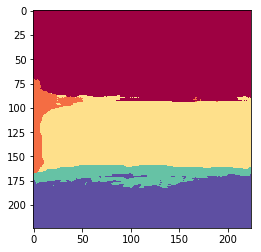

In [90]:
sets = ['train', 'test']
names = [train_list, test_list]
for ns, s in enumerate(sets):
    for i, p1 in enumerate(pred_net[s]):
        name = names[ns][i].strip().replace('/data/test/', '').replace('/data/train/', '').replace('.jpg', '')
        name = 'seg-results/' + s + '-'+ name + ".png"
        
        p1p = p1.reshape(224, 224, 6)
        p1p = np.argmax(p1p, axis=2)
        
        plt.imsave(name, p1p, cmap=cmap)

# Build Masks

In [45]:
from scipy.ndimage.filters import gaussian_filter
import cv2
import numpy as np
import scipy.misc
from keras_wrapper.dataset import loadDataset
from keras_wrapper.dataset import Dataset
import os
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [32]:
def get_seg_carotida(it, ds_path):
    dataset_name = "dat" + str(it)
    ds = Dataset(dataset_name, ds_path)
    
    images_size = [470, 445, 1]
    images_crop_size = [224, 224, 1]
    image_id = 'input_image'+ str(it)
    ds.setInput(ds_path + '/test.txt', 'test',
            type='raw-image', id=image_id,
            img_size=images_size, img_size_crop=images_crop_size,use_RGB=False)
    
    predict_overriden_parameters = {'batch_size': 1, 'predict_on_sets': ['test']}
    pred_net = net.predictNet(ds, predict_overriden_parameters)
    
    p1 = pred_net['test'][0]
    
    probs = p1.reshape(224, 224, 6)
    seg = np.argmax(probs, axis=2)
    
    plt.imshow(seg, cmap=cmap)
    plt.show()
    
    return probs, seg

def save_perturbated(ds_path, perturbated):
    cv2.imwrite(ds_path + "/0.jpg", perturbated)

def scale_array(x, new_size):
    min_el = np.min(x)
    max_el = np.max(x)
    y = scipy.misc.imresize(x, new_size, mode='L', interp='nearest')
    y = y / 255 * (max_el - min_el) + min_el
    return y

def perturb_image(original_img, blurred_img, mask):
    return np.multiply(original_img, mask) + np.multiply(blurred_img,(1 - mask))

def get_loss(probs_target, probs_out, target_class, R, mask):
    fcx = probs_target[:,:,target_class]
    fcxp = probs_out[:,:,target_class]
    
    subs = fcx - fcxp
    maxs = np.maximum(subs, np.zeros((subs.shape)))
    mul = np.multiply(R, maxs)
    
    l1mul = np.linalg.norm(mul, ord = 1)    
    l1r = np.linalg.norm((1 - R), ord = 1)
    l1m = L1_COEFF*np.linalg.norm(mask, ord = 1)

    loss = l1m + (l1mul / l1r)
    return loss, l1m, (l1mul / l1r)

In [15]:
NEAR_WALL = 0
LUMEN_BULB = 1
LUMEN_CCA = 2
IMT_BULB = 3
IMT_CCA = 4
FAR_WALL = 5

IMG_SIZE = (470, 445)

DS_PATH = "./dataset-auxiliar"

L1_COEFF = 0.01

In [16]:
def get_imt_area_mask(mask, expand, disolve):
    expanded = gaussian_filter(mask, sigma=expand)
    expanded = (expanded != 0).astype(float)*255

    return gaussian_filter(expanded, sigma=disolve)/255

In [171]:
def diagnose_image(p1, img_path, img_name):
    
    # Create dir to store the result
    path = "diagnosis/" + img_name

    try:
        os.mkdir(path)
    except OSError:
        pass
    
    
    # Initial segmentation of image
    pred_probs = p1.reshape(224, 224, 6)
    pred = np.argmax(pred_probs, axis=2)
    
    # Save initial segmentation
    cmap = matplotlib.cm.get_cmap('Spectral')
    plt.imsave(path + '/pred.png', pred, cmap=cmap)
    
    print ("OG Segmentation:")
    plt.imshow(pred, cmap=cmap)
    plt.show()
    
    # Region of interest
    R = (pred == IMT_CCA).astype(int)

    # Original image and blurred for mixing
    original_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    blurred_img = cv2.medianBlur(original_img, 41)
    
    # Copy of original image
    plt.imsave(path + '/original.png', original_img)
    
    
    # Component masks
    mask_imt = scale_array((pred == IMT_CCA).astype(int), IMG_SIZE)
    mask_imt_near = scale_array(((pred == IMT_CCA) | (pred == NEAR_WALL)).astype(int), IMG_SIZE)
    mask_imt_far = scale_array(((pred == IMT_CCA) | (pred == FAR_WALL)).astype(int), IMG_SIZE)
    mask_imt_lbulb = scale_array(((pred == IMT_CCA) | (pred == LUMEN_BULB)).astype(int), IMG_SIZE)
    mask_imt_ibulb = scale_array(((pred == IMT_CCA) | (pred == IMT_BULB)).astype(int), IMG_SIZE)
    mask_imt_lcca = scale_array(((pred == IMT_CCA) | (pred == LUMEN_CCA)).astype(int), IMG_SIZE)

    # Imt area masks
    mask_imt_5 = get_imt_area_mask(mask_imt*255, 5, 5)
    mask_imt_10 = get_imt_area_mask(mask_imt*255, 10, 10)
    mask_imt_15 = get_imt_area_mask(mask_imt*255, 15, 10)
    mask_imt_20 = get_imt_area_mask(mask_imt*255, 20, 10)


    masks_diag = [mask_imt, mask_imt_near, mask_imt_far, mask_imt_lbulb, mask_imt_ibulb, 
                  mask_imt_lcca, mask_imt_5, mask_imt_10, mask_imt_15, mask_imt_20]
    mask_names = ["IMT Only", "IMT and Near Wall", "IMT and Far Wall", "IMT and Lumen Bulb", "IMT and IMT Bulb",
                  "IMT and Lumen CCA", "IMT Expanded 5", "IMT Expanded 10", "IMT Expanded 15", "IMT Expanded 20"]
    mask_codes = ["imt-only", "imt-nw", "imt-fw", "imt-lbulb", "imt-ibulb",
                  "imt-lcca", "imt-5", "imt-10", "imt-15", "imt-20"]
    

    columns = ['Mask', 'Loss', 'Mask Loss', 'Seg Loss']
    df = pd.DataFrame(columns=columns)
    
    for mask_idx, mask_diag in enumerate(masks_diag):  
        plt.figure()
        if np.max(mask_diag) == 0: continue
        
        mask_name = mask_names[mask_idx]
        mask_code = mask_codes[mask_idx]
        print (mask_name)
        
        perturbed_image = perturb_image(original_img, blurred_img, mask_diag)
        
        # Save image perturbed in the dataset-auxiliar
        save_perturbated(DS_PATH, perturbed_image)
        
        per = cv2.imread(DS_PATH + "/0.jpg", cv2.IMREAD_GRAYSCALE)
        plt.imshow(per)
        plt.show()
        
        # Predict again with the net
        probs_out, seg_out = get_seg_carotida(mask_code + img_name, DS_PATH)
        loss, mloss, sloss = get_loss(pred_probs, probs_out, IMT_CCA, R, mask_diag)
        
        # Save new segmentation and mask
        plt.imsave(path + '/'+ mask_code +'-seg.png', seg_out, cmap=cmap)
        plt.imsave(path + '/'+ mask_code +'-mask.png', mask_diag, cmap='hot')
        
        original_img_full = cv2.imread(img_path)
        img_mask = cv2.imread(path + '/'+ mask_code +'-mask.png')
        
        mixed = (0.5*img_mask + 0.5*original_img_full).astype(int)
        plt.imshow(mixed)
        plt.show()
        plt.imsave(path + '/'+ mask_code +'-mixed.png', mixed)
        
        df = df.append({'Mask' : mask_name, 'Loss': loss, 'Mask Loss': mloss, 'Seg Loss': sloss} , ignore_index=True)
        
        
    print(df)
    
    plt.figure()
    df.plot.bar(x='Mask', y=['Loss', 'Mask Loss', 'Seg Loss'], rot=70)
    plt.savefig(path + '/loss-plot.png',bbox_inches='tight')
    
    df.to_csv(path + '/loss.csv', index=False)
        

# Execute diagnosis

./carotida/data/test/10TEST20.jpg
10TEST20
0
OG Segmentation:


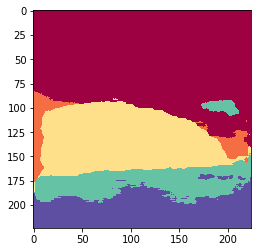

IMT Only


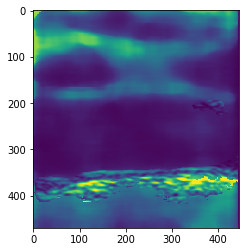

1/1 [==============================] - 5s 5s/step


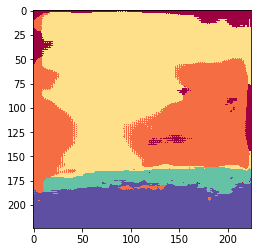

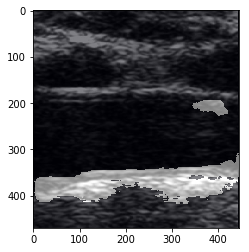

IMT and Near Wall


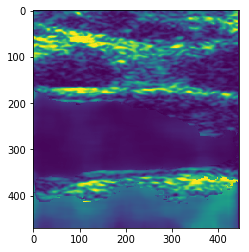

1/1 [==============================] - 5s 5s/step


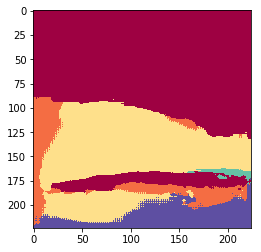

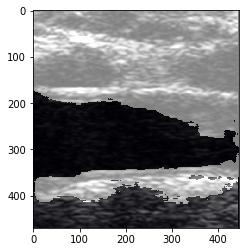

IMT and Far Wall


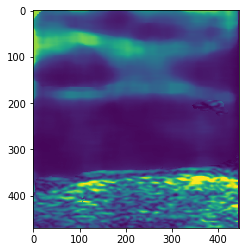

1/1 [==============================] - 5s 5s/step


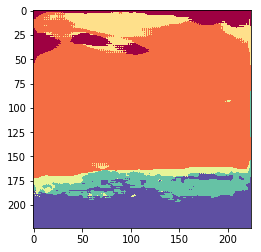

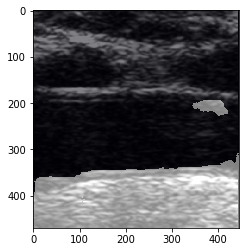

IMT and Lumen Bulb


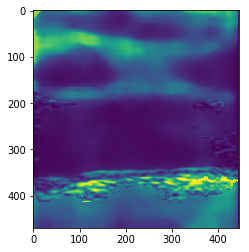

1/1 [==============================] - 5s 5s/step


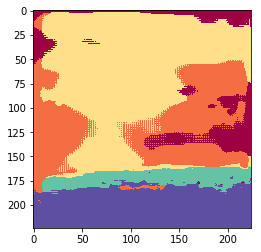

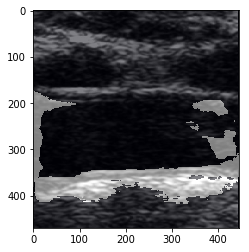

IMT and IMT Bulb


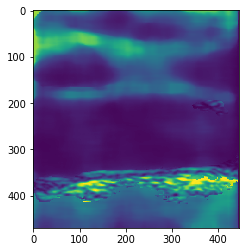

1/1 [==============================] - 5s 5s/step


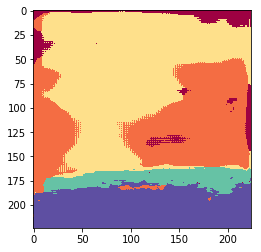

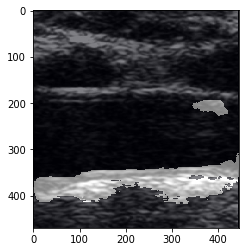

IMT and Lumen CCA


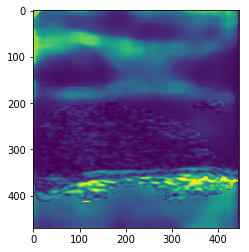

1/1 [==============================] - 5s 5s/step


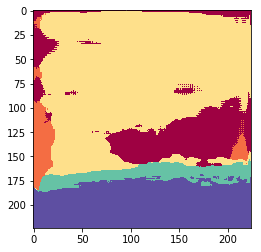

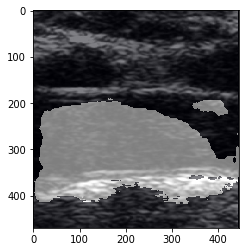

IMT Expanded 5


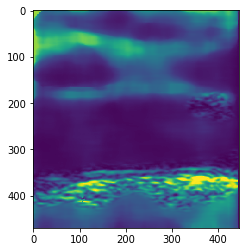

1/1 [==============================] - 5s 5s/step


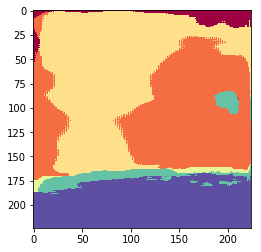

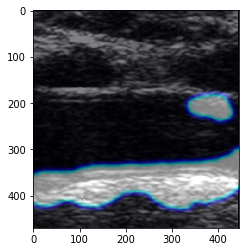

IMT Expanded 10


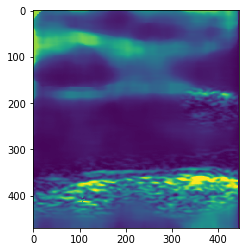

1/1 [==============================] - 5s 5s/step


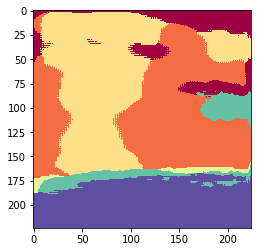

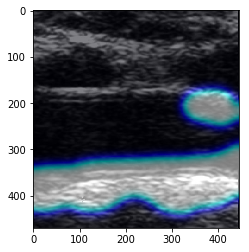

IMT Expanded 15


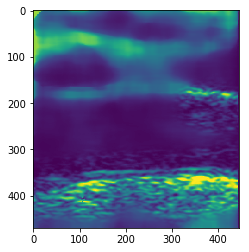

1/1 [==============================] - 5s 5s/step


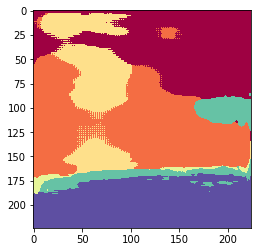

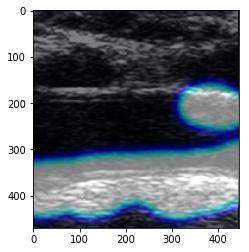

IMT Expanded 20


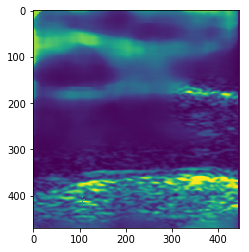

1/1 [==============================] - 5s 5s/step


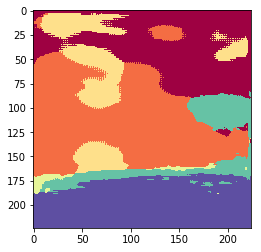

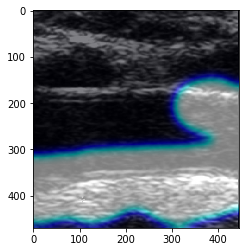

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  1.058437   0.970000  0.088437
1   IMT and Near Wall  3.670683   3.540000  0.130683
2    IMT and Far Wall  1.814848   1.720000  0.094848
3  IMT and Lumen Bulb  2.414657   2.330000  0.084657
4    IMT and IMT Bulb  1.060527   0.970000  0.090527
5   IMT and Lumen CCA  2.252395   2.160000  0.092395
6      IMT Expanded 5  1.613713   1.504947  0.108766
7     IMT Expanded 10  2.107317   1.995734  0.111583
8     IMT Expanded 15  2.583225   2.481612  0.101613
9     IMT Expanded 20  3.116059   3.018287  0.097772
./carotida/data/test/11TEST20.jpg
11TEST20
1
OG Segmentation:


<Figure size 432x288 with 0 Axes>

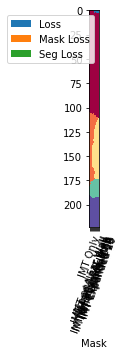

IMT Only


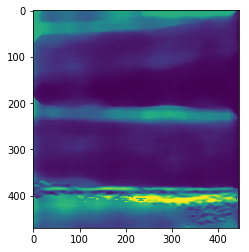

1/1 [==============================] - 5s 5s/step


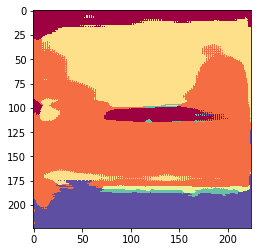

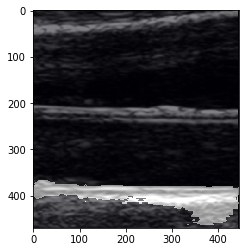

IMT and Near Wall


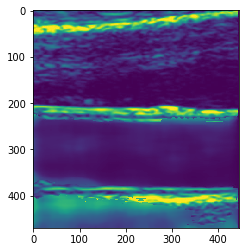

1/1 [==============================] - 5s 5s/step


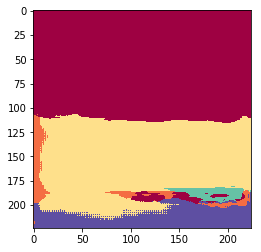

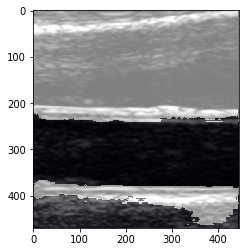

IMT and Far Wall


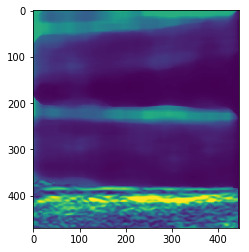

1/1 [==============================] - 5s 5s/step


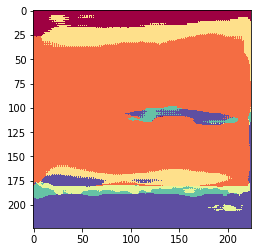

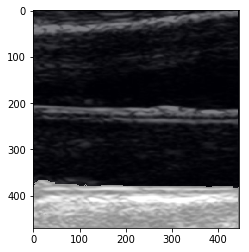

IMT and Lumen Bulb


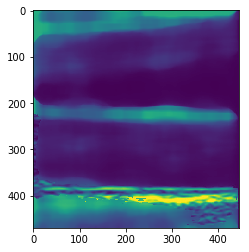

1/1 [==============================] - 5s 5s/step


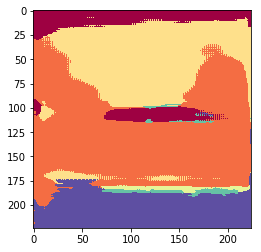

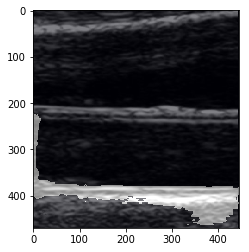

IMT and IMT Bulb


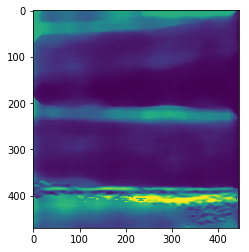

1/1 [==============================] - 5s 5s/step


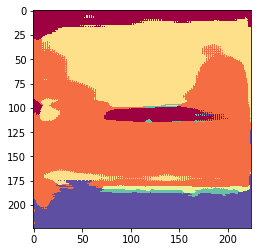

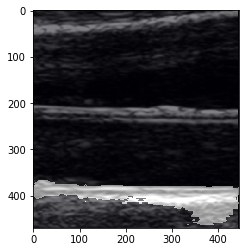

IMT and Lumen CCA


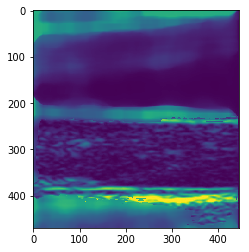

1/1 [==============================] - 5s 5s/step


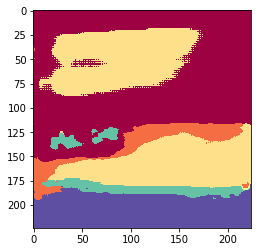

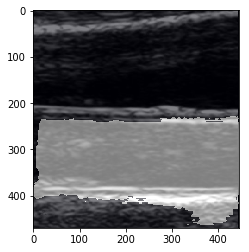

IMT Expanded 5


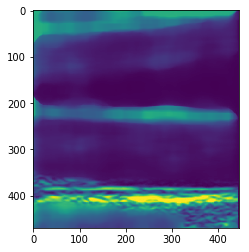

1/1 [==============================] - 5s 5s/step


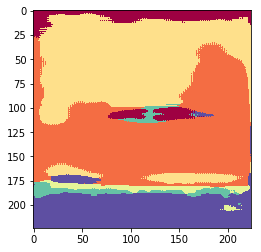

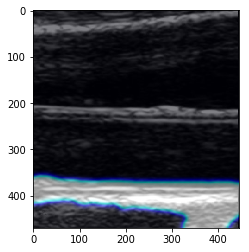

IMT Expanded 10


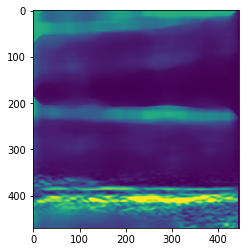

1/1 [==============================] - 5s 5s/step


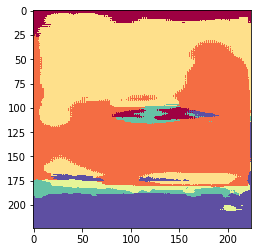

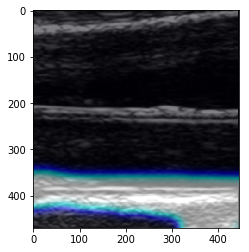

IMT Expanded 15


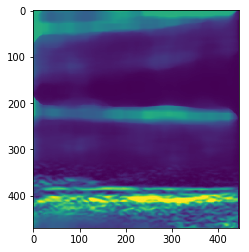

1/1 [==============================] - 5s 5s/step


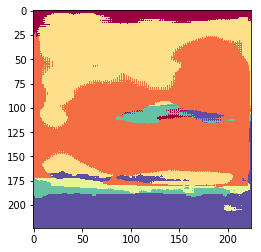

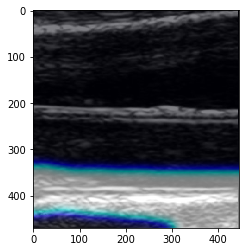

IMT Expanded 20


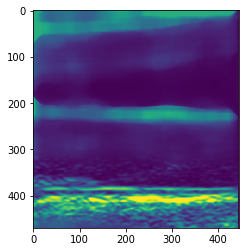

1/1 [==============================] - 5s 5s/step


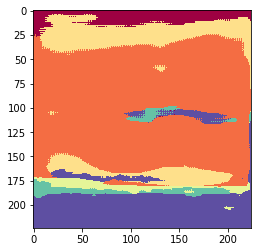

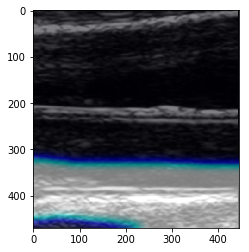

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.975375   0.840000  0.135375
1   IMT and Near Wall  3.350286   3.230000  0.120286
2    IMT and Far Wall  1.169836   1.030000  0.139836
3  IMT and Lumen Bulb  1.935873   1.800000  0.135873
4    IMT and IMT Bulb  0.975375   0.840000  0.135375
5   IMT and Lumen CCA  2.427547   2.310000  0.117547
6      IMT Expanded 5  1.144685   1.020000  0.124685
7     IMT Expanded 10  1.281371   1.154036  0.127334
8     IMT Expanded 15  1.395890   1.260000  0.135890
9     IMT Expanded 20  1.571535   1.429934  0.141601
./carotida/data/test/12TEST20.jpg
12TEST20
2
OG Segmentation:


<Figure size 432x288 with 0 Axes>

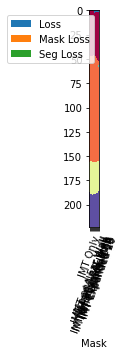

IMT Only


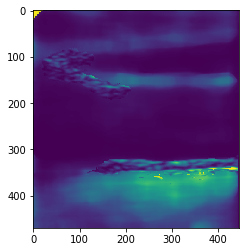

1/1 [==============================] - 6s 6s/step


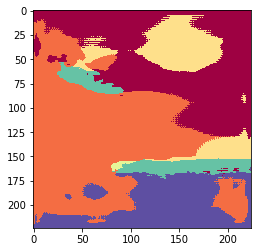

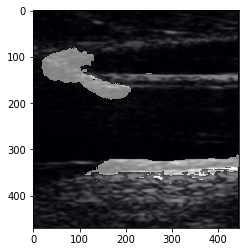

IMT and Near Wall


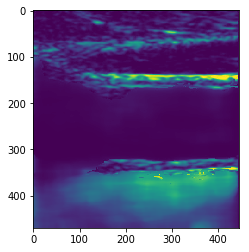

1/1 [==============================] - 6s 6s/step


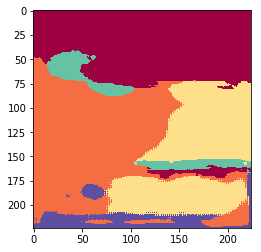

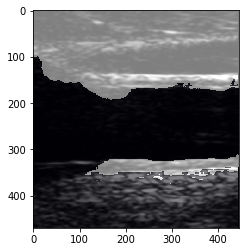

IMT and Far Wall


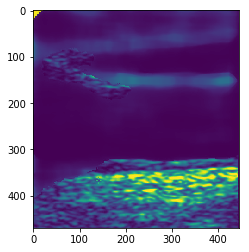

1/1 [==============================] - 6s 6s/step


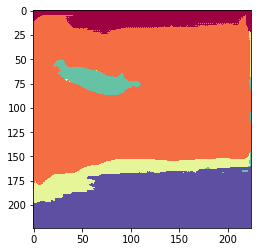

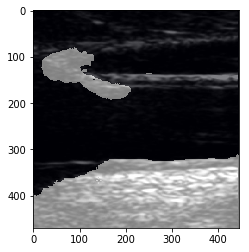

IMT and Lumen Bulb


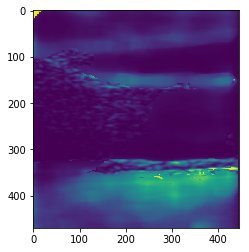

1/1 [==============================] - 6s 6s/step


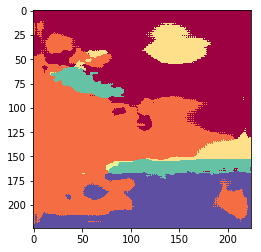

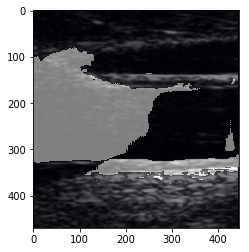

IMT and IMT Bulb


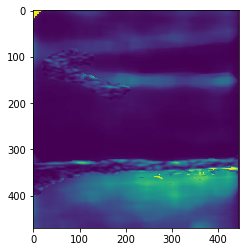

1/1 [==============================] - 6s 6s/step


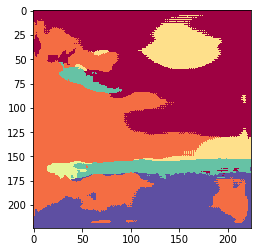

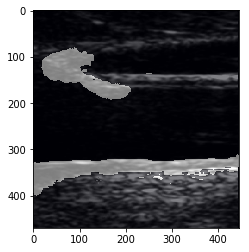

IMT and Lumen CCA


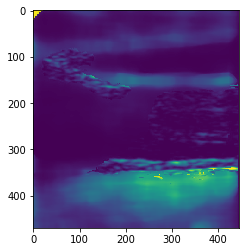

1/1 [==============================] - 6s 6s/step


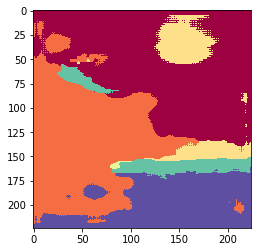

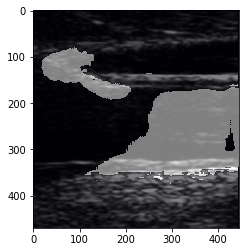

IMT Expanded 5


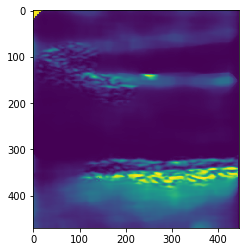

1/1 [==============================] - 6s 6s/step


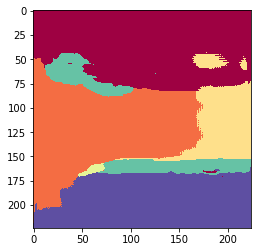

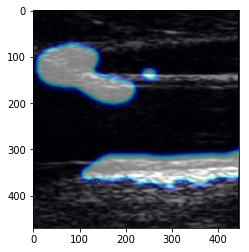

IMT Expanded 10


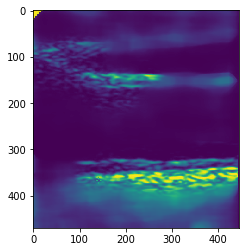

1/1 [==============================] - 6s 6s/step


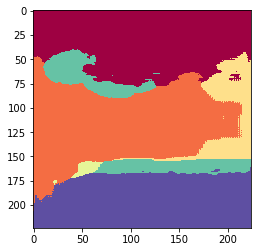

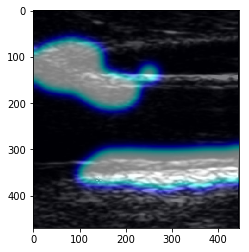

IMT Expanded 15


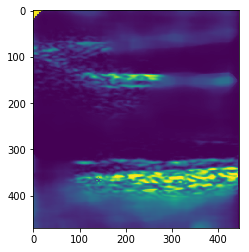

1/1 [==============================] - 6s 6s/step


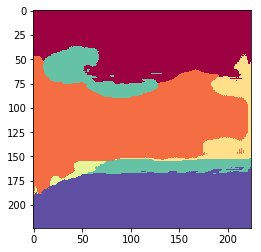

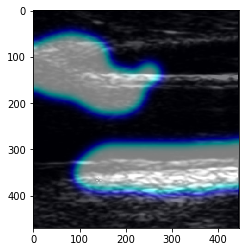

IMT Expanded 20


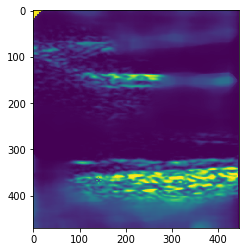

1/1 [==============================] - 6s 6s/step


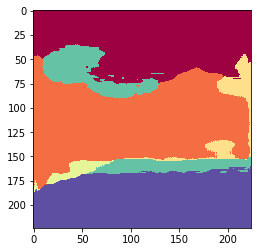

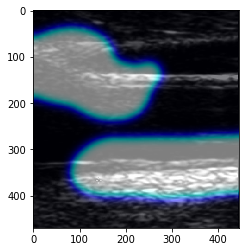

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.876136   0.770000  0.106136
1   IMT and Near Wall  2.351833   2.270000  0.081833
2    IMT and Far Wall  1.956001   1.860000  0.096001
3  IMT and Lumen Bulb  2.527681   2.430000  0.097681
4    IMT and IMT Bulb  1.280612   1.170000  0.110612
5   IMT and Lumen CCA  1.997523   1.890000  0.107523
6      IMT Expanded 5  1.489036   1.437651  0.051385
7     IMT Expanded 10  2.054330   2.029812  0.024518
8     IMT Expanded 15  2.596107   2.574008  0.022099
9     IMT Expanded 20  3.103997   3.080971  0.023026
./carotida/data/test/13TEST20.jpg
13TEST20
3
OG Segmentation:


<Figure size 432x288 with 0 Axes>

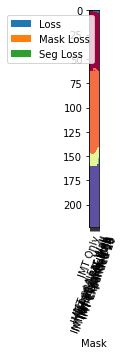

IMT Only


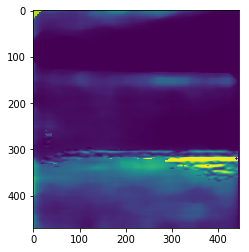

1/1 [==============================] - 6s 6s/step


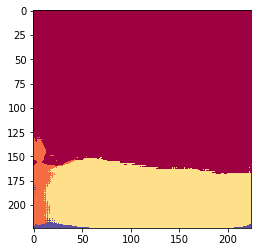

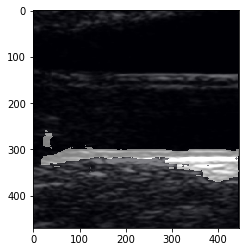

IMT and Near Wall


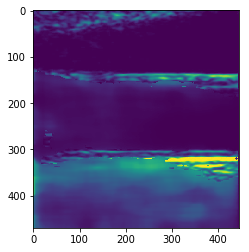

1/1 [==============================] - 6s 6s/step


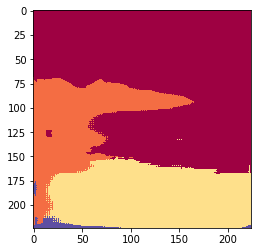

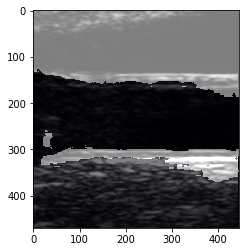

IMT and Far Wall


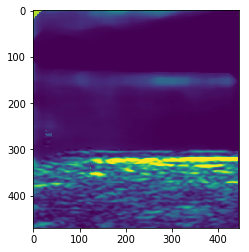

1/1 [==============================] - 6s 6s/step


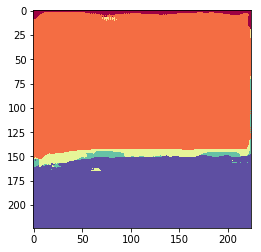

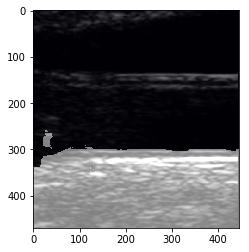

IMT and Lumen Bulb


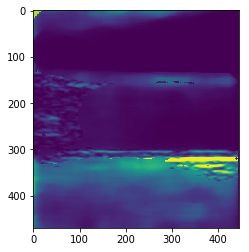

1/1 [==============================] - 6s 6s/step


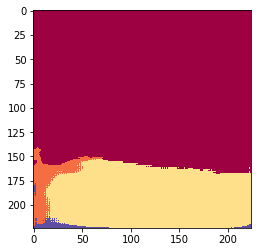

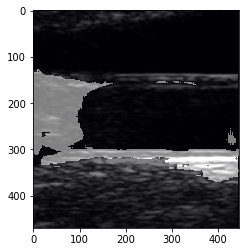

IMT and IMT Bulb


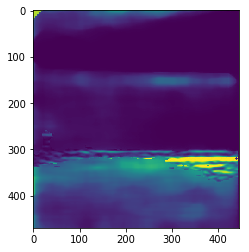

1/1 [==============================] - 6s 6s/step


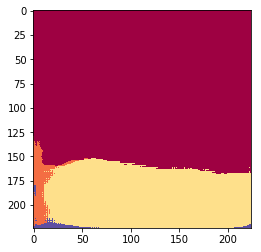

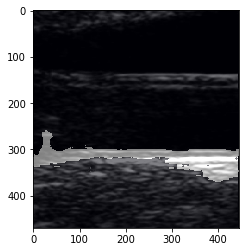

IMT and Lumen CCA


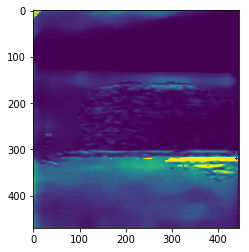

1/1 [==============================] - 6s 6s/step


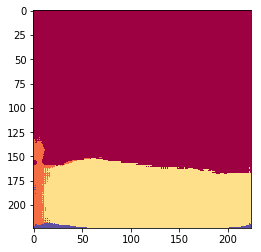

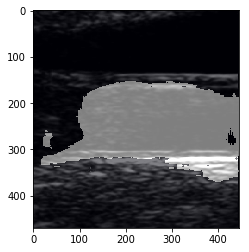

IMT Expanded 5


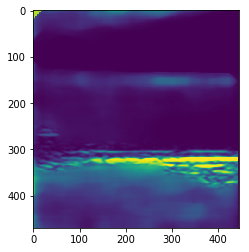

1/1 [==============================] - 6s 6s/step


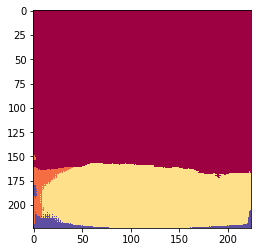

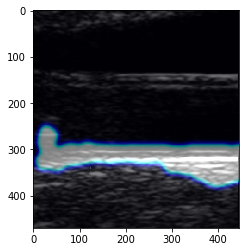

IMT Expanded 10


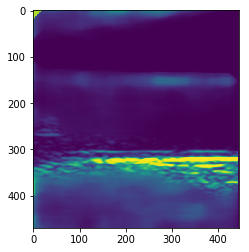

1/1 [==============================] - 6s 6s/step


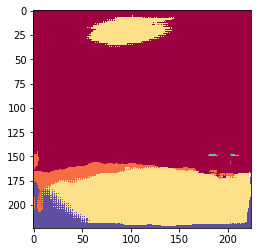

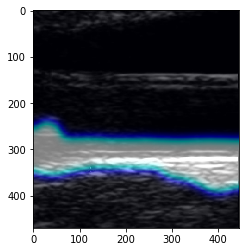

IMT Expanded 15


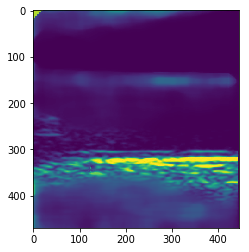

1/1 [==============================] - 6s 6s/step


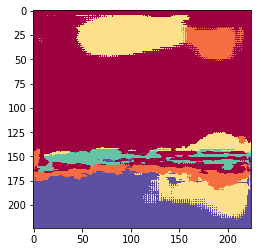

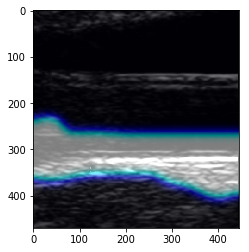

IMT Expanded 20


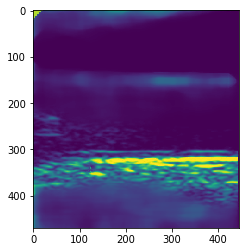

1/1 [==============================] - 6s 6s/step


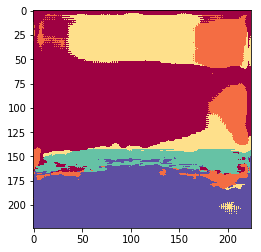

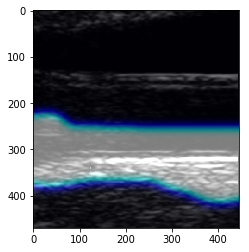

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.842500   0.710000  0.132500
1   IMT and Near Wall  2.672570   2.540000  0.132570
2    IMT and Far Wall  2.019650   1.910000  0.109650
3  IMT and Lumen Bulb  2.002340   1.870000  0.132340
4    IMT and IMT Bulb  0.892494   0.760000  0.132494
5   IMT and Lumen CCA  2.102116   1.970000  0.132116
6      IMT Expanded 5  1.113255   0.981956  0.131299
7     IMT Expanded 10  1.308277   1.184688  0.123589
8     IMT Expanded 15  1.520336   1.424045  0.096291
9     IMT Expanded 20  1.726297   1.659839  0.066457
./carotida/data/test/14TEST20.jpg
14TEST20
4
OG Segmentation:


<Figure size 432x288 with 0 Axes>

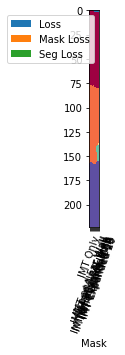

IMT Only


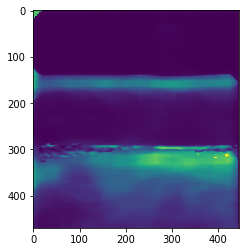

1/1 [==============================] - 6s 6s/step


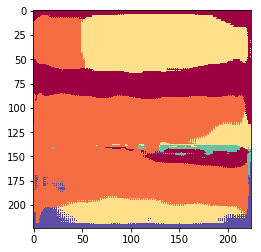

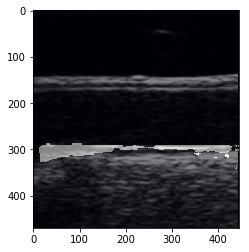

IMT and Near Wall


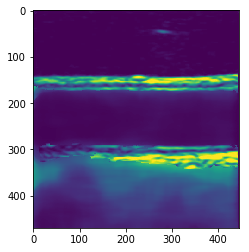

1/1 [==============================] - 6s 6s/step


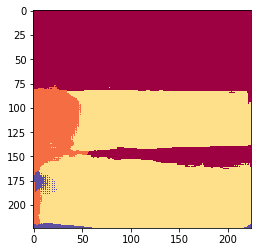

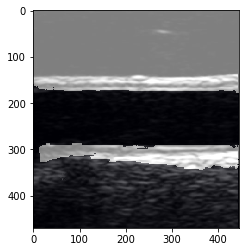

IMT and Far Wall


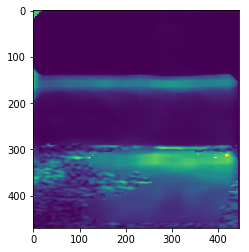

1/1 [==============================] - 6s 6s/step


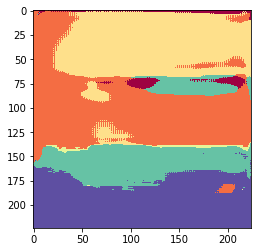

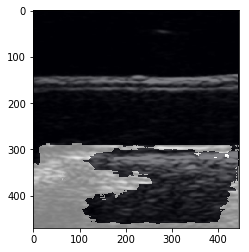

IMT and Lumen Bulb


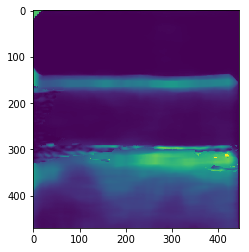

1/1 [==============================] - 6s 6s/step


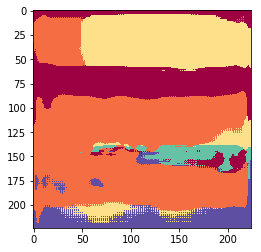

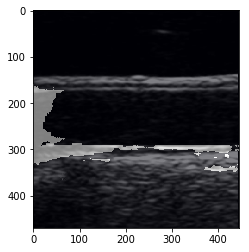

IMT and IMT Bulb


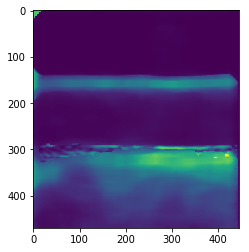

1/1 [==============================] - 6s 6s/step


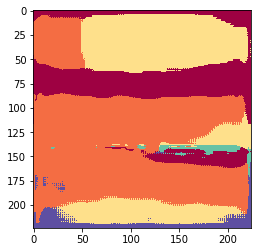

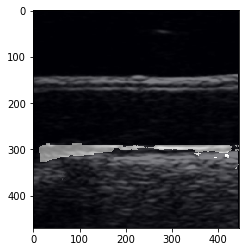

IMT and Lumen CCA


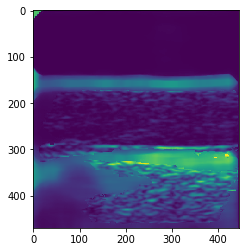

1/1 [==============================] - 6s 6s/step


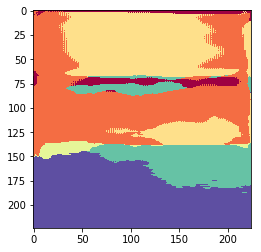

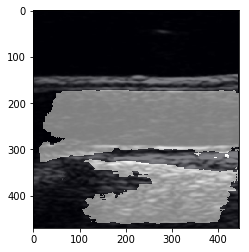

IMT Expanded 5


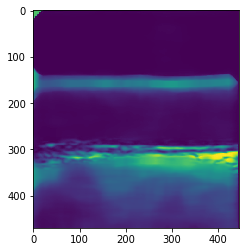

1/1 [==============================] - 6s 6s/step


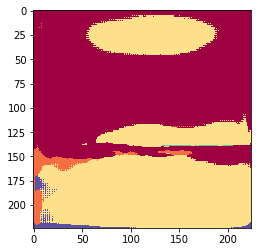

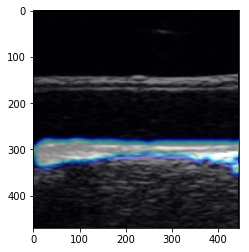

IMT Expanded 10


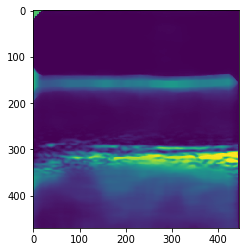

1/1 [==============================] - 6s 6s/step


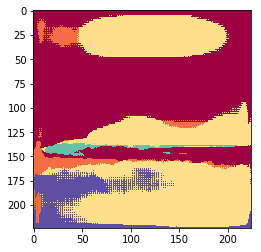

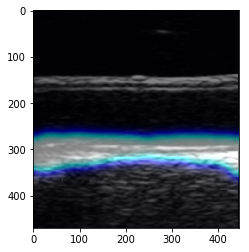

IMT Expanded 15


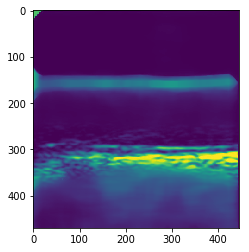

1/1 [==============================] - 6s 6s/step


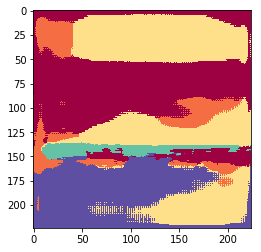

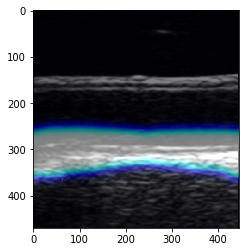

IMT Expanded 20


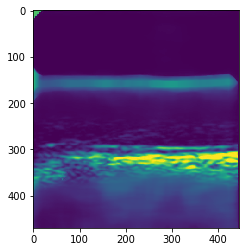

1/1 [==============================] - 6s 6s/step


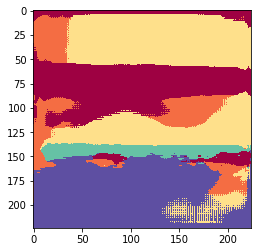

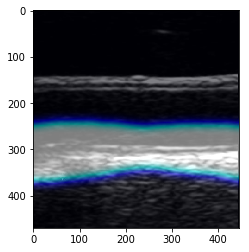

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.469541   0.400000  0.069541
1   IMT and Near Wall  2.351126   2.280000  0.071126
2    IMT and Far Wall  1.860584   1.830000  0.030584
3  IMT and Lumen Bulb  1.800386   1.730000  0.070386
4    IMT and IMT Bulb  0.469541   0.400000  0.069541
5   IMT and Lumen CCA  2.654406   2.590000  0.064406
6      IMT Expanded 5  0.694917   0.623756  0.071161
7     IMT Expanded 10  0.943790   0.888631  0.055159
8     IMT Expanded 15  1.118488   1.079968  0.038520
9     IMT Expanded 20  1.347088   1.314353  0.032735
./carotida/data/test/16TEST20.jpg
16TEST20
5
OG Segmentation:


<Figure size 432x288 with 0 Axes>

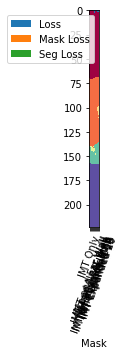

IMT Only


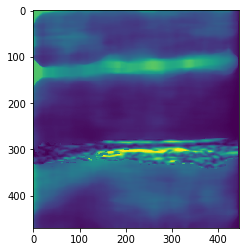

1/1 [==============================] - 6s 6s/step


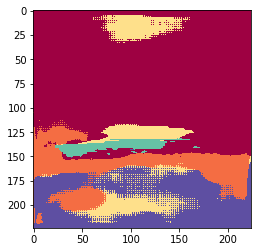

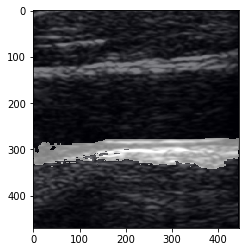

IMT and Near Wall


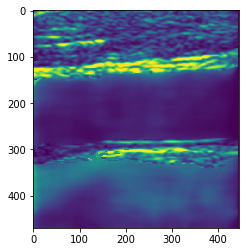

1/1 [==============================] - 6s 6s/step


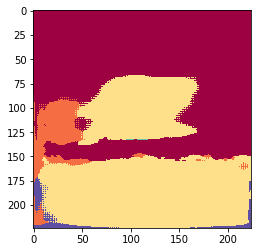

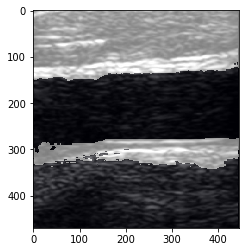

IMT and Far Wall


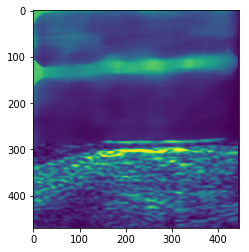

1/1 [==============================] - 6s 6s/step


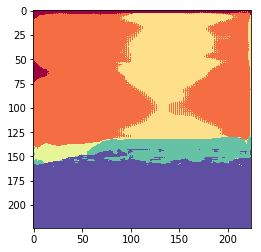

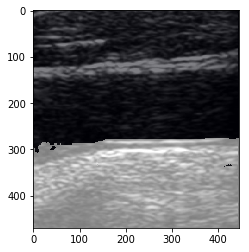

IMT and Lumen Bulb


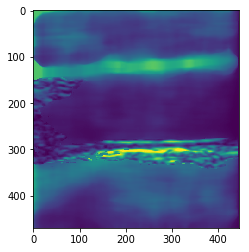

1/1 [==============================] - 6s 6s/step


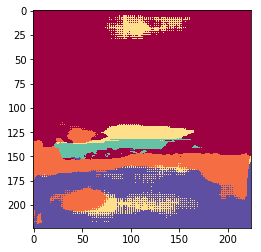

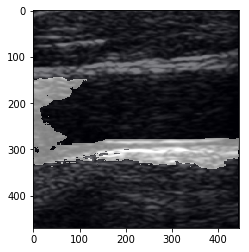

IMT and IMT Bulb


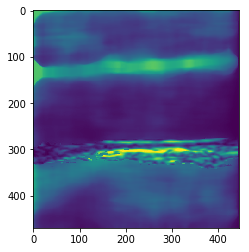

1/1 [==============================] - 6s 6s/step


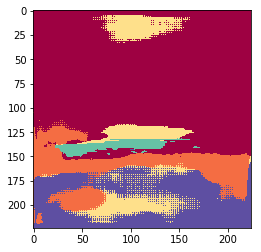

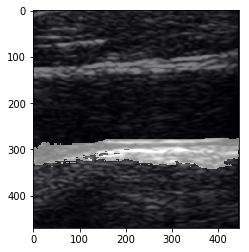

IMT and Lumen CCA


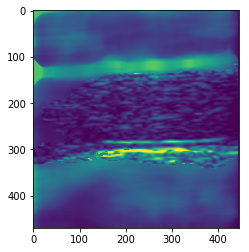

1/1 [==============================] - 6s 6s/step


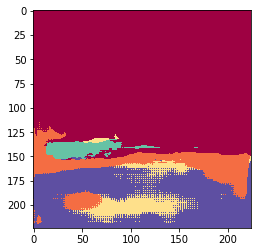

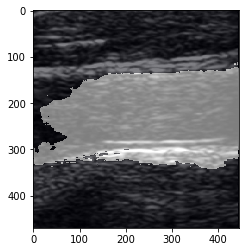

IMT Expanded 5


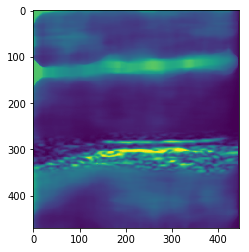

1/1 [==============================] - 6s 6s/step


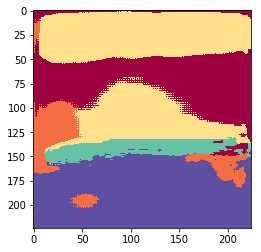

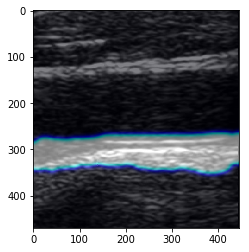

IMT Expanded 10


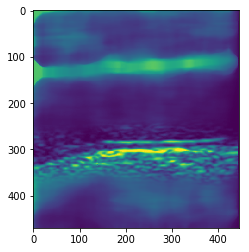

1/1 [==============================] - 6s 6s/step


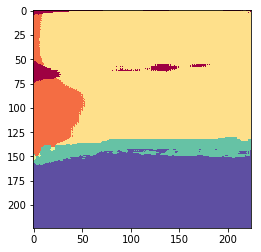

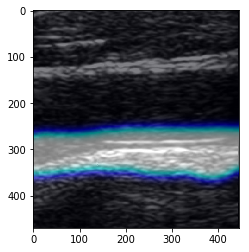

IMT Expanded 15


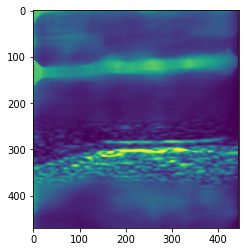

1/1 [==============================] - 6s 6s/step


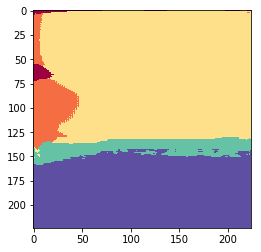

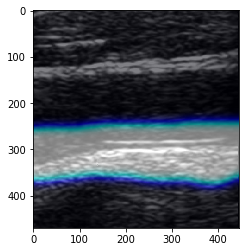

IMT Expanded 20


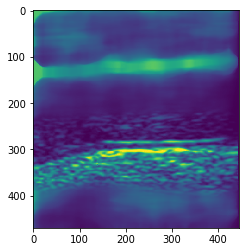

1/1 [==============================] - 6s 6s/step


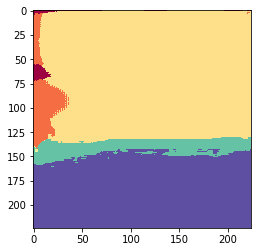

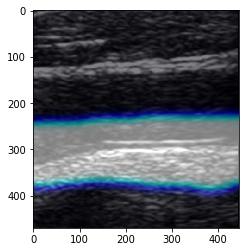

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.803807   0.670000  0.133807
1   IMT and Near Wall  2.123900   1.990000  0.133900
2    IMT and Far Wall  2.009871   1.950000  0.059871
3  IMT and Lumen Bulb  2.003792   1.870000  0.133792
4    IMT and IMT Bulb  0.803806   0.670000  0.133806
5   IMT and Lumen CCA  2.253766   2.120000  0.133766
6      IMT Expanded 5  0.996760   0.906532  0.090228
7     IMT Expanded 10  1.195073   1.145894  0.049179
8     IMT Expanded 15  1.437846   1.388564  0.049282
9     IMT Expanded 20  1.694456   1.637881  0.056576
./carotida/data/test/17TEST20.jpg
17TEST20
6
OG Segmentation:


<Figure size 432x288 with 0 Axes>

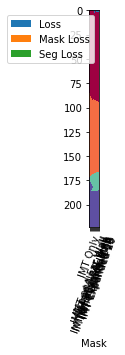

IMT Only


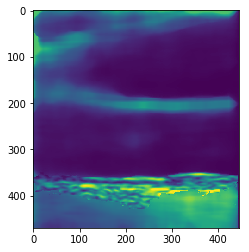

1/1 [==============================] - 6s 6s/step


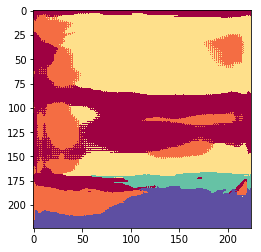

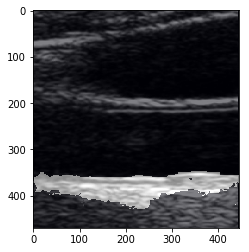

IMT and Near Wall


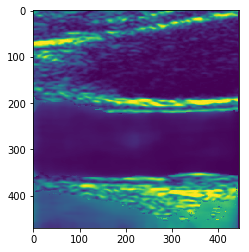

1/1 [==============================] - 6s 6s/step


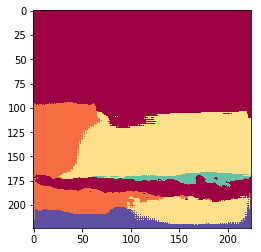

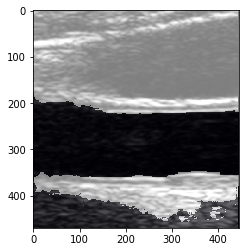

IMT and Far Wall


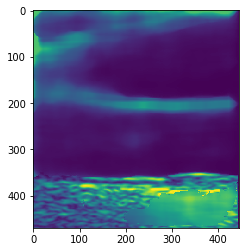

1/1 [==============================] - 6s 6s/step


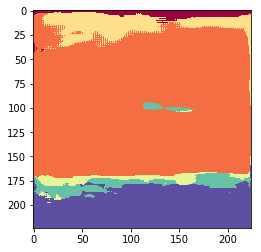

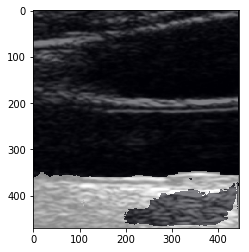

IMT and Lumen Bulb


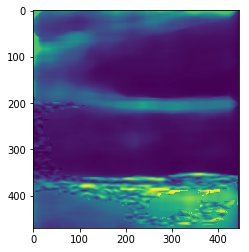

1/1 [==============================] - 6s 6s/step


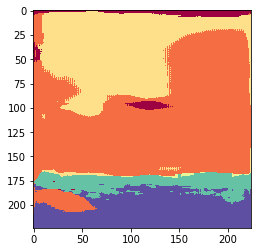

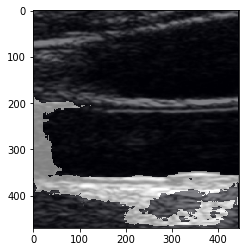

IMT and IMT Bulb


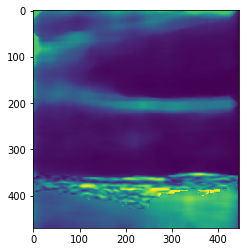

1/1 [==============================] - 6s 6s/step


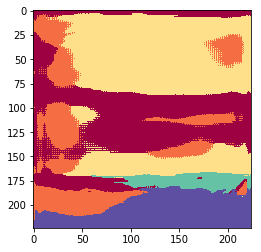

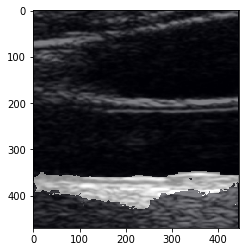

IMT and Lumen CCA


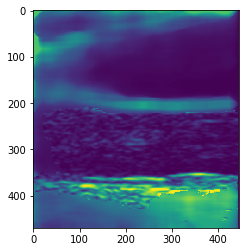

1/1 [==============================] - 6s 6s/step


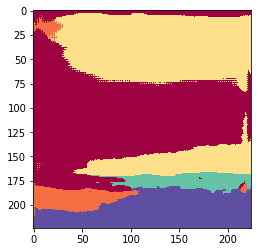

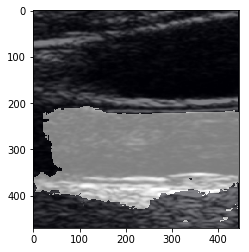

IMT Expanded 5


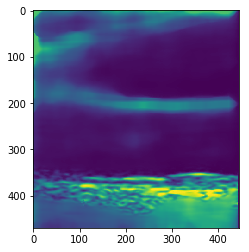

1/1 [==============================] - 6s 6s/step


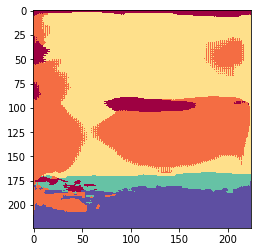

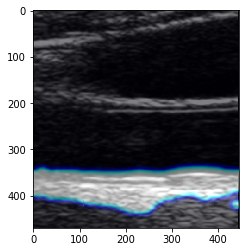

IMT Expanded 10


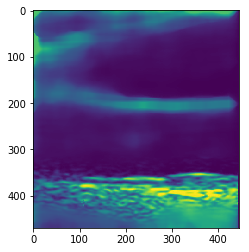

1/1 [==============================] - 6s 6s/step


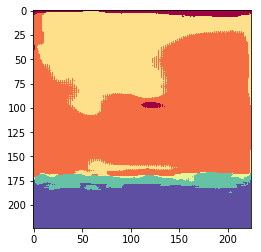

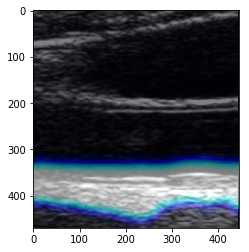

IMT Expanded 15


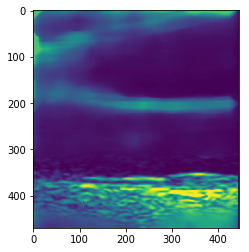

1/1 [==============================] - 6s 6s/step


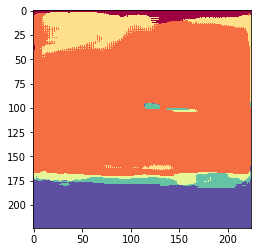

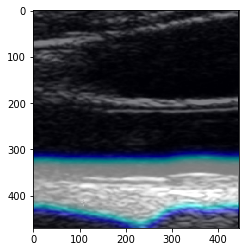

IMT Expanded 20


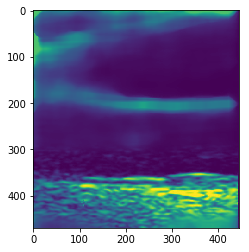

1/1 [==============================] - 6s 6s/step


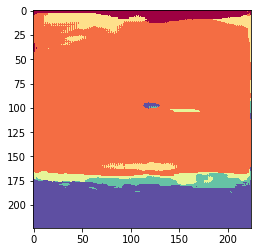

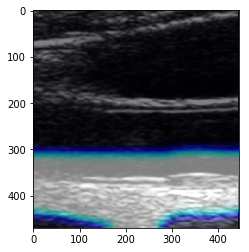

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.825183   0.730000  0.095183
1   IMT and Near Wall  3.292410   3.180000  0.112410
2    IMT and Far Wall  1.313151   1.200000  0.113151
3  IMT and Lumen Bulb  2.063893   1.990000  0.073893
4    IMT and IMT Bulb  0.825189   0.730000  0.095189
5   IMT and Lumen CCA  2.151719   2.060000  0.091719
6      IMT Expanded 5  1.046275   0.968263  0.078012
7     IMT Expanded 10  1.299148   1.205424  0.093724
8     IMT Expanded 15  1.555090   1.452538  0.102552
9     IMT Expanded 20  1.734792   1.640000  0.094792
./carotida/data/test/18TEST20.jpg
18TEST20
7
OG Segmentation:


<Figure size 432x288 with 0 Axes>

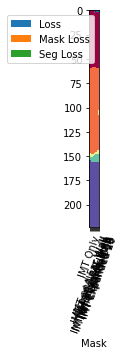

IMT Only


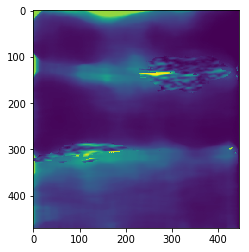

1/1 [==============================] - 6s 6s/step


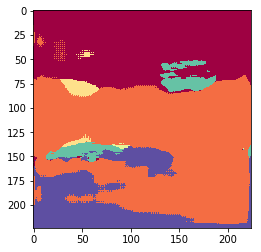

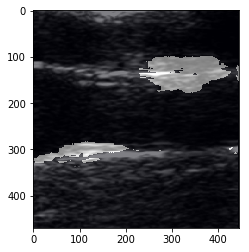

IMT and Near Wall


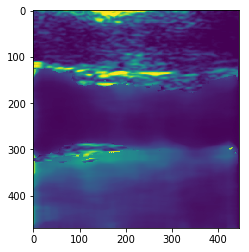

1/1 [==============================] - 6s 6s/step


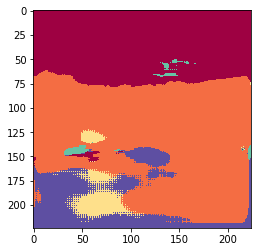

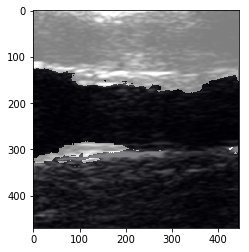

IMT and Far Wall


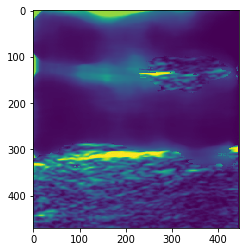

1/1 [==============================] - 6s 6s/step


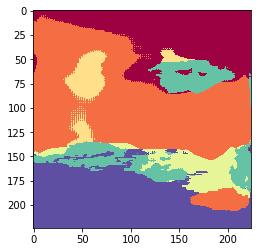

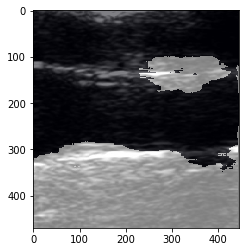

IMT and Lumen Bulb


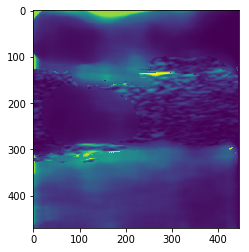

1/1 [==============================] - 6s 6s/step


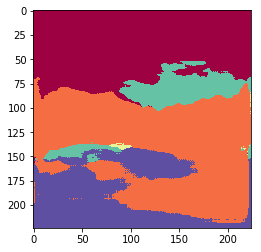

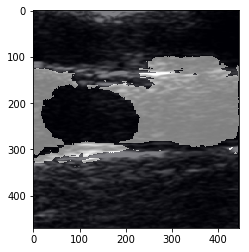

IMT and IMT Bulb


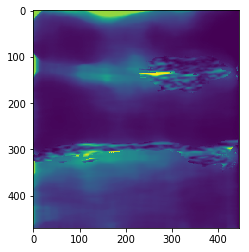

1/1 [==============================] - 6s 6s/step


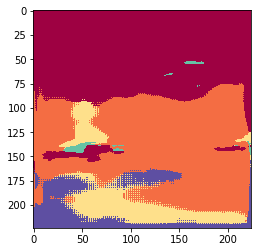

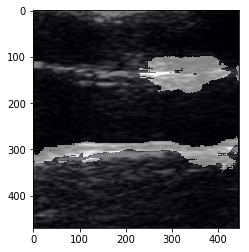

IMT and Lumen CCA


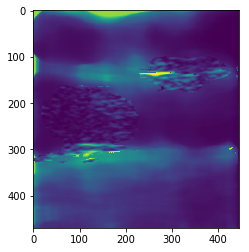

1/1 [==============================] - 6s 6s/step


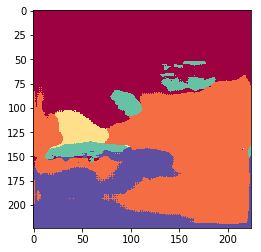

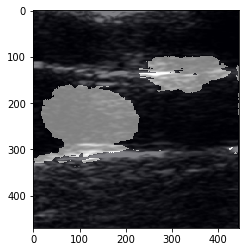

IMT Expanded 5


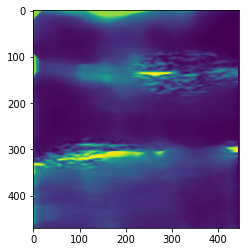

1/1 [==============================] - 6s 6s/step


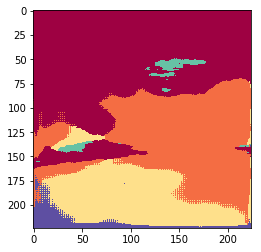

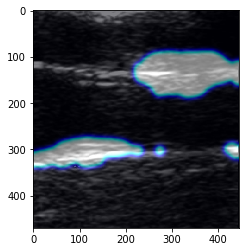

IMT Expanded 10


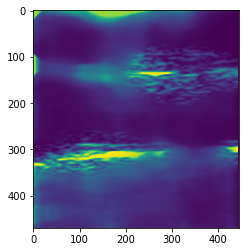

1/1 [==============================] - 6s 6s/step


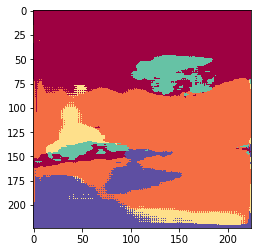

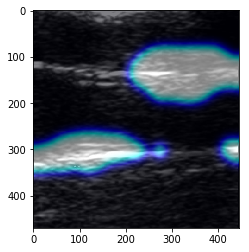

IMT Expanded 15


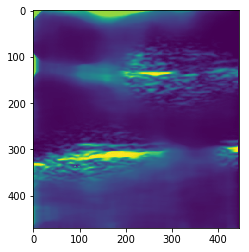

1/1 [==============================] - 6s 6s/step


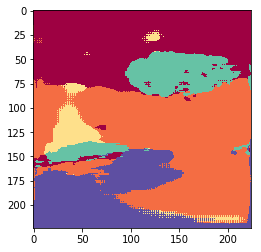

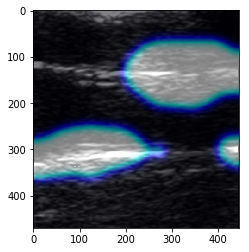

IMT Expanded 20


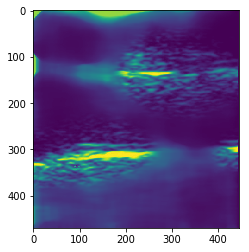

1/1 [==============================] - 6s 6s/step


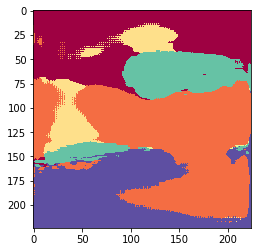

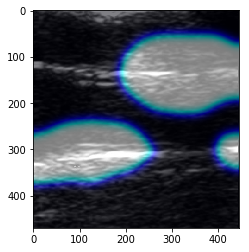

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.883152   0.790000  0.093152
1   IMT and Near Wall  2.166345   2.040000  0.126345
2    IMT and Far Wall  2.822739   2.780000  0.042739
3  IMT and Lumen Bulb  2.047490   1.990000  0.057490
4    IMT and IMT Bulb  1.271508   1.150000  0.121508
5   IMT and Lumen CCA  1.683793   1.590000  0.093793
6      IMT Expanded 5  1.295587   1.178482  0.117106
7     IMT Expanded 10  1.517418   1.435568  0.081850
8     IMT Expanded 15  1.704129   1.681431  0.022698
9     IMT Expanded 20  2.088078   2.072121  0.015957
./carotida/data/test/19TEST20.jpg
19TEST20
8
OG Segmentation:


<Figure size 432x288 with 0 Axes>

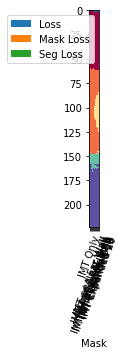

IMT Only


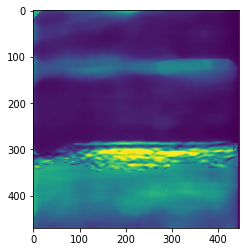

1/1 [==============================] - 6s 6s/step


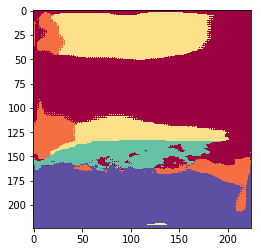

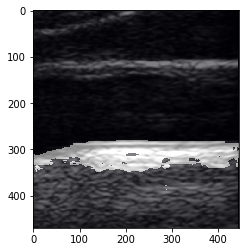

IMT and Near Wall


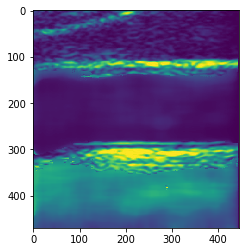

1/1 [==============================] - 6s 6s/step


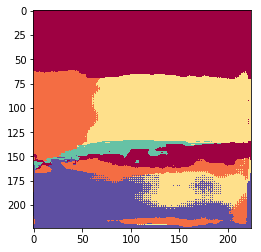

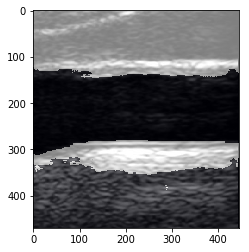

IMT and Far Wall


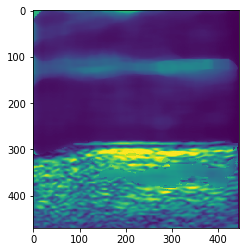

1/1 [==============================] - 6s 6s/step


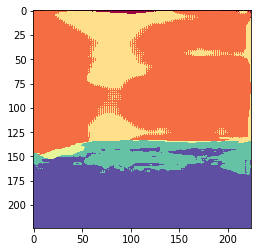

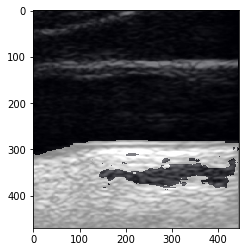

IMT and Lumen Bulb


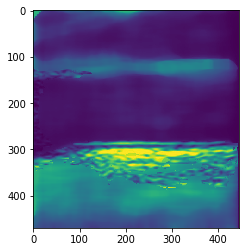

1/1 [==============================] - 6s 6s/step


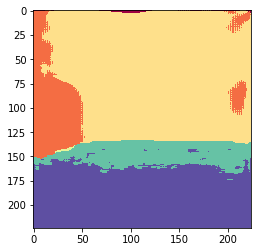

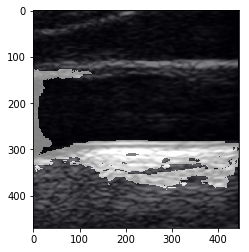

IMT and IMT Bulb


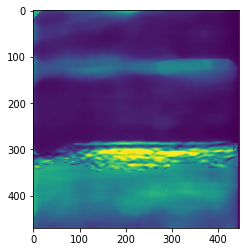

1/1 [==============================] - 6s 6s/step


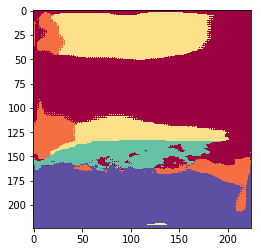

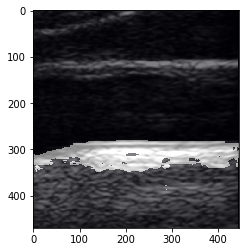

IMT and Lumen CCA


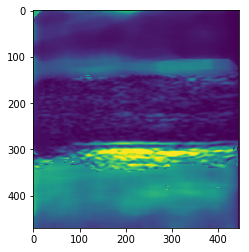

1/1 [==============================] - 6s 6s/step


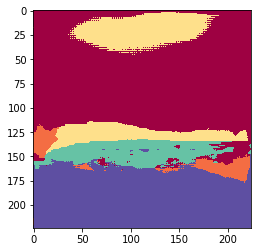

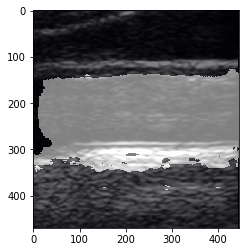

IMT Expanded 5


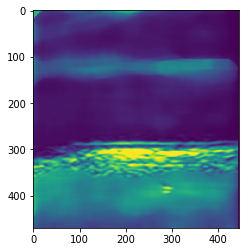

1/1 [==============================] - 6s 6s/step


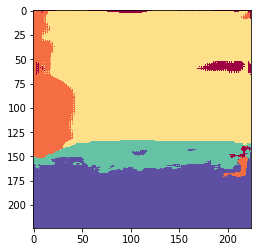

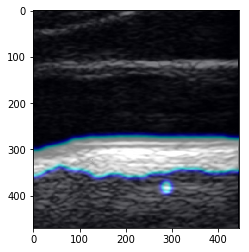

IMT Expanded 10


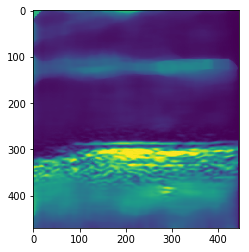

1/1 [==============================] - 6s 6s/step


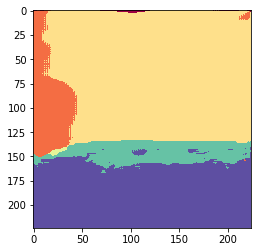

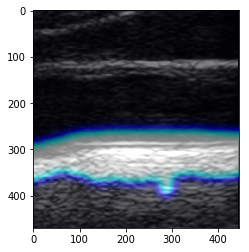

IMT Expanded 15


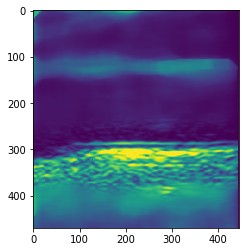

1/1 [==============================] - 6s 6s/step


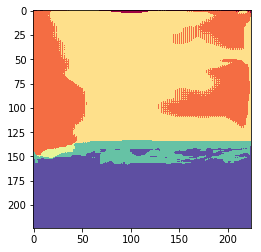

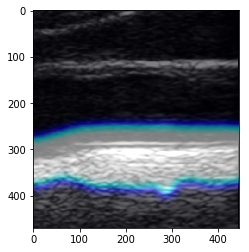

IMT Expanded 20


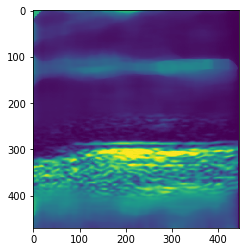

1/1 [==============================] - 6s 6s/step


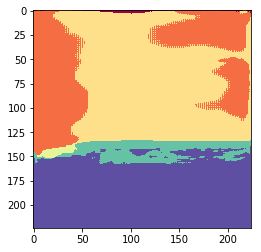

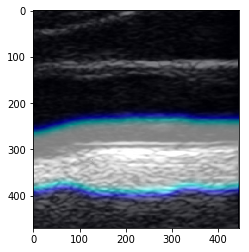

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.795414   0.690000  0.105414
1   IMT and Near Wall  2.247012   2.140000  0.107012
2    IMT and Far Wall  1.916010   1.870000  0.046010
3  IMT and Lumen Bulb  2.208201   2.180000  0.028201
4    IMT and IMT Bulb  0.795414   0.690000  0.105414
5   IMT and Lumen CCA  2.212227   2.120000  0.092227
6      IMT Expanded 5  1.109461   1.071095  0.038366
7     IMT Expanded 10  1.414403   1.377747  0.036656
8     IMT Expanded 15  1.560398   1.509253  0.051144
9     IMT Expanded 20  1.722572   1.668462  0.054110
./carotida/data/test/1TEST20.jpg
1TEST20
9
OG Segmentation:


<Figure size 432x288 with 0 Axes>

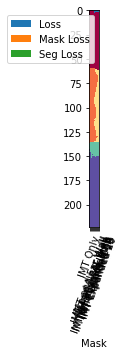

IMT Only


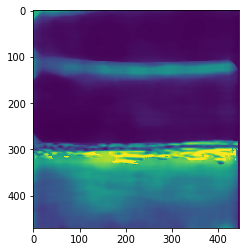

1/1 [==============================] - 6s 6s/step


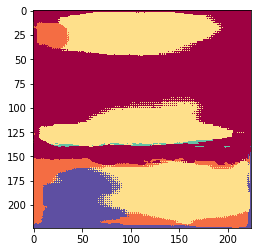

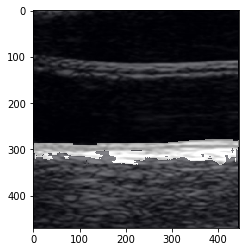

IMT and Near Wall


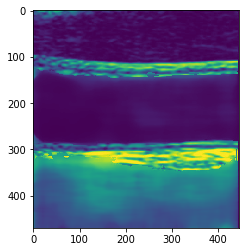

1/1 [==============================] - 6s 6s/step


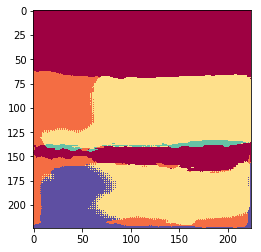

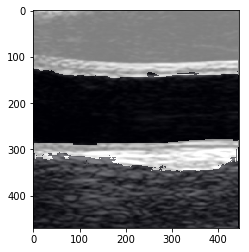

IMT and Far Wall


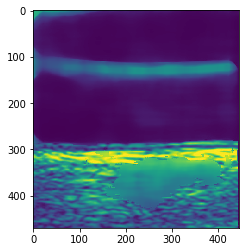

1/1 [==============================] - 6s 6s/step


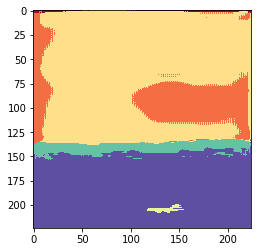

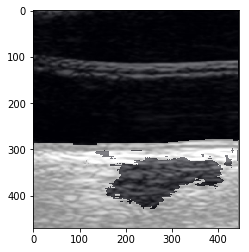

IMT and Lumen Bulb


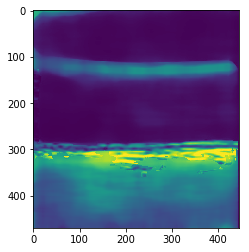

1/1 [==============================] - 6s 6s/step


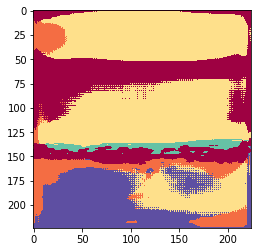

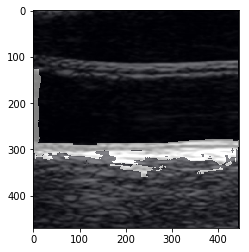

IMT and IMT Bulb


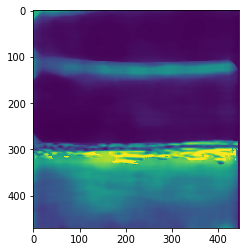

1/1 [==============================] - 6s 6s/step


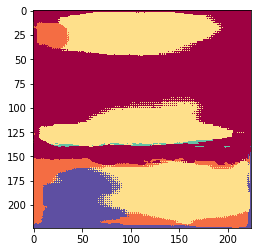

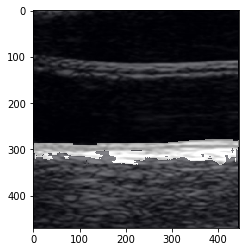

IMT and Lumen CCA


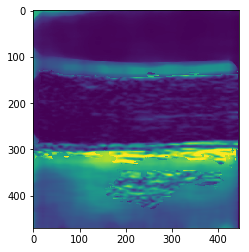

1/1 [==============================] - 6s 6s/step


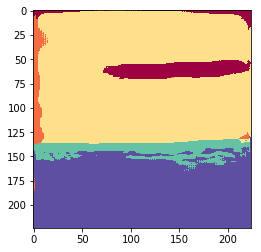

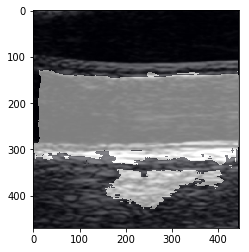

IMT Expanded 5


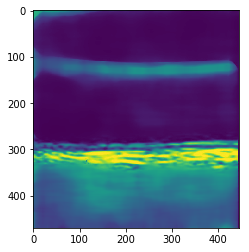

1/1 [==============================] - 6s 6s/step


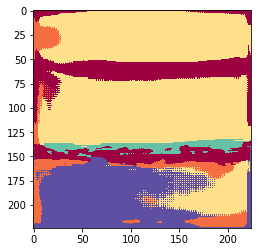

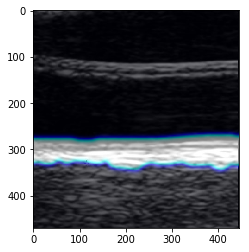

IMT Expanded 10


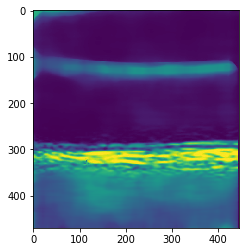

1/1 [==============================] - 6s 6s/step


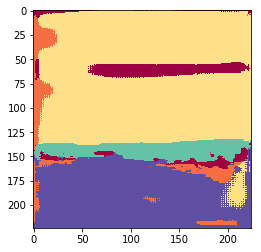

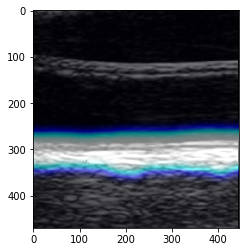

IMT Expanded 15


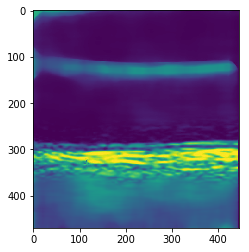

1/1 [==============================] - 6s 6s/step


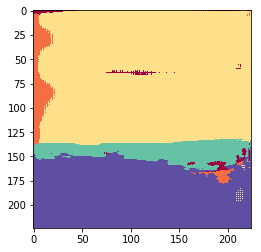

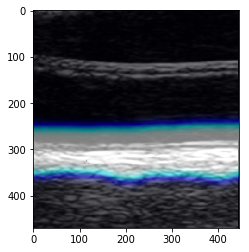

IMT Expanded 20


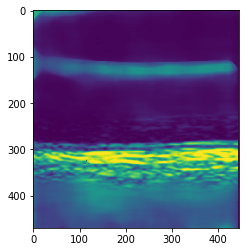

1/1 [==============================] - 6s 6s/step


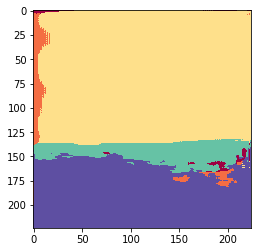

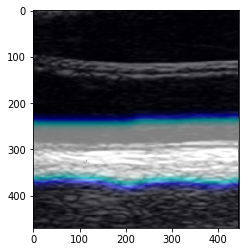

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.648094   0.550000  0.098094
1   IMT and Near Wall  2.163575   2.080000  0.083575
2    IMT and Far Wall  1.939529   1.890000  0.049529
3  IMT and Lumen Bulb  1.999304   1.930000  0.069304
4    IMT and IMT Bulb  0.648094   0.550000  0.098094
5   IMT and Lumen CCA  2.710661   2.670000  0.040661
6      IMT Expanded 5  0.841645   0.782758  0.058887
7     IMT Expanded 10  1.031816   1.008493  0.023323
8     IMT Expanded 15  1.255693   1.235119  0.020574
9     IMT Expanded 20  1.473020   1.459286  0.013734
./carotida/data/test/20TEST20.jpg
20TEST20
10
OG Segmentation:


<Figure size 432x288 with 0 Axes>

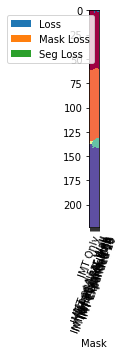

IMT Only


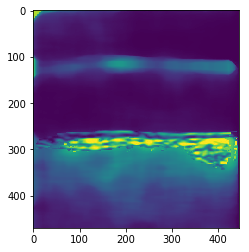

1/1 [==============================] - 6s 6s/step


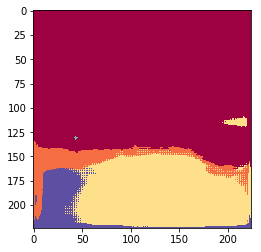

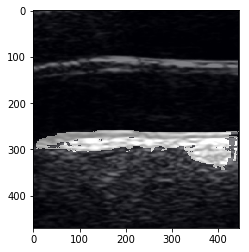

IMT and Near Wall


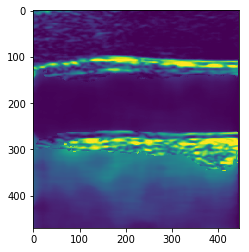

1/1 [==============================] - 6s 6s/step


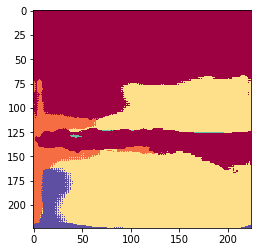

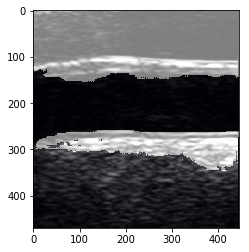

IMT and Far Wall


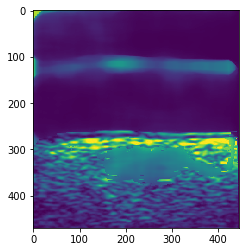

1/1 [==============================] - 6s 6s/step


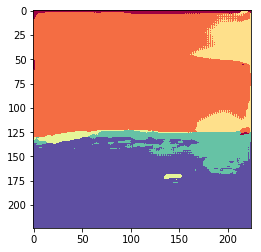

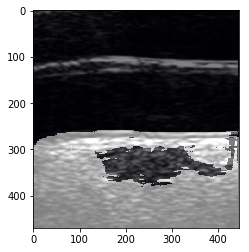

IMT and Lumen Bulb


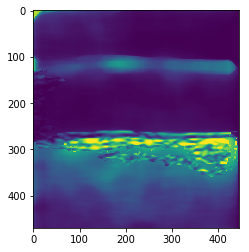

1/1 [==============================] - 7s 7s/step


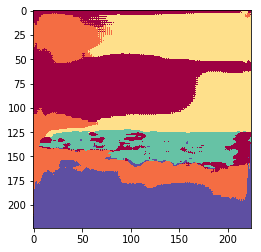

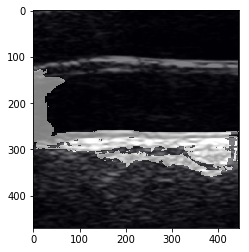

IMT and IMT Bulb


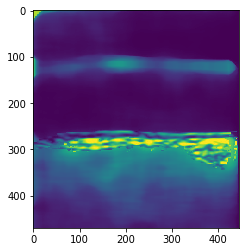

1/1 [==============================] - 6s 6s/step


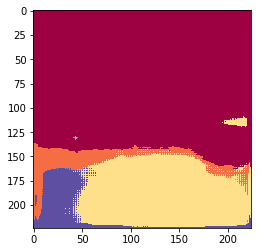

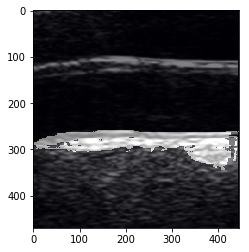

IMT and Lumen CCA


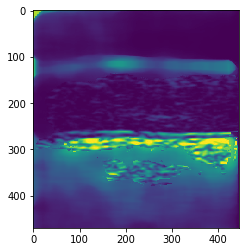

1/1 [==============================] - 6s 6s/step


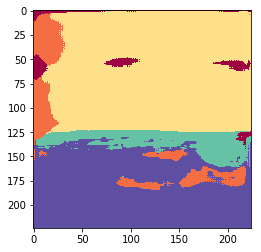

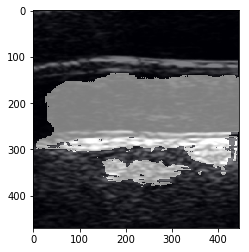

IMT Expanded 5


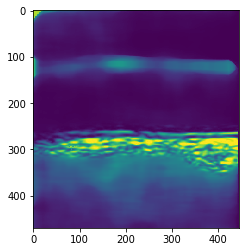

1/1 [==============================] - 6s 6s/step


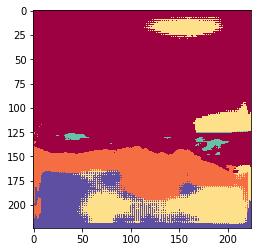

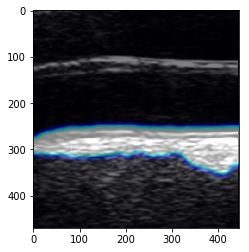

IMT Expanded 10


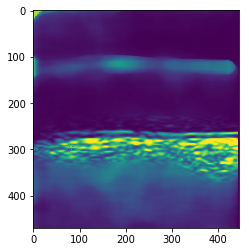

1/1 [==============================] - 6s 6s/step


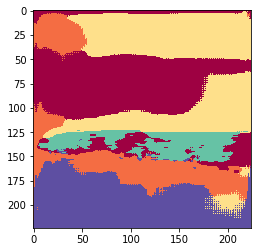

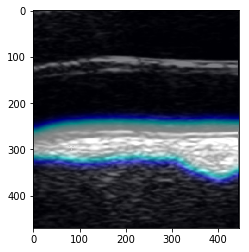

IMT Expanded 15


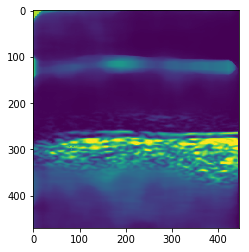

1/1 [==============================] - 6s 6s/step


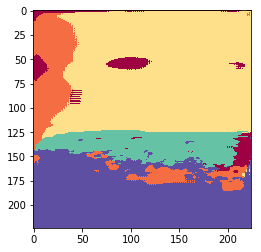

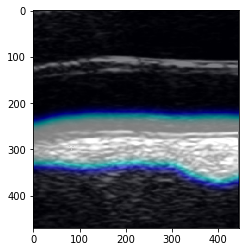

IMT Expanded 20


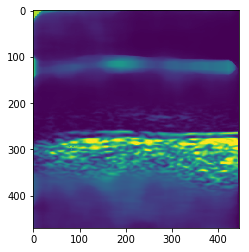

1/1 [==============================] - 6s 6s/step


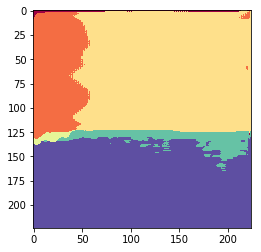

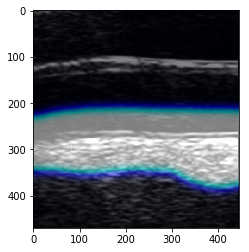

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.961762   0.820000  0.141762
1   IMT and Near Wall  2.430665   2.290000  0.140665
2    IMT and Far Wall  2.157825   2.100000  0.057825
3  IMT and Lumen Bulb  1.791854   1.720000  0.071854
4    IMT and IMT Bulb  0.961763   0.820000  0.141763
5   IMT and Lumen CCA  2.145329   2.120000  0.025329
6      IMT Expanded 5  1.199593   1.062589  0.137003
7     IMT Expanded 10  1.389400   1.290594  0.098806
8     IMT Expanded 15  1.562099   1.514089  0.048010
9     IMT Expanded 20  1.784544   1.737815  0.046729
./carotida/data/test/2TEST20.jpg
2TEST20
11
OG Segmentation:


<Figure size 432x288 with 0 Axes>

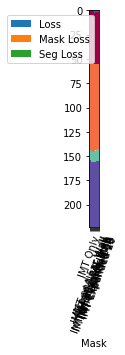

IMT Only


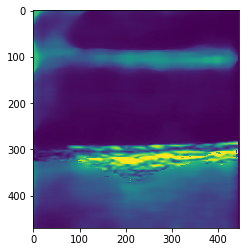

1/1 [==============================] - 6s 6s/step


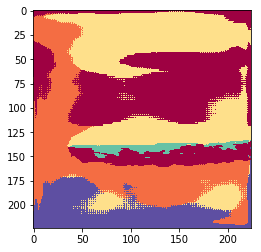

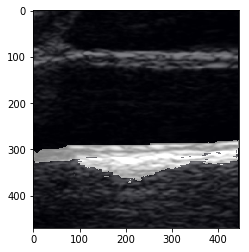

IMT and Near Wall


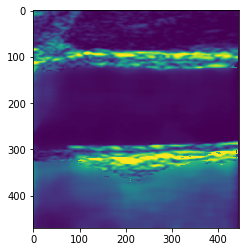

1/1 [==============================] - 6s 6s/step


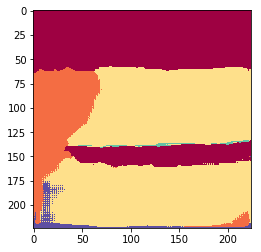

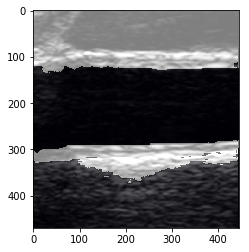

IMT and Far Wall


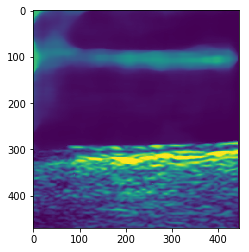

1/1 [==============================] - 6s 6s/step


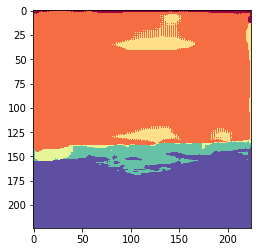

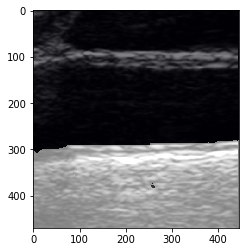

IMT and Lumen Bulb


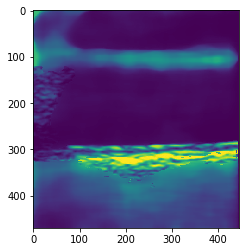

1/1 [==============================] - 6s 6s/step


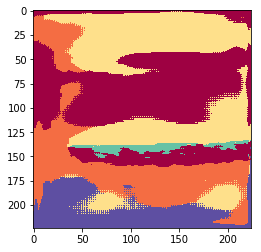

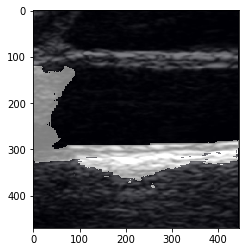

IMT and IMT Bulb


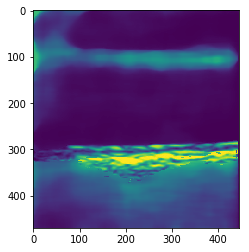

1/1 [==============================] - 6s 6s/step


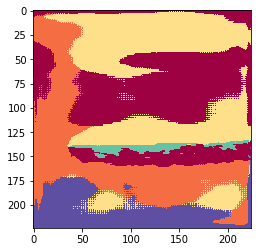

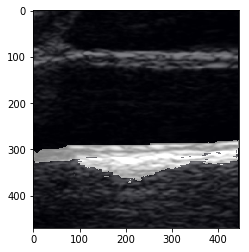

IMT and Lumen CCA


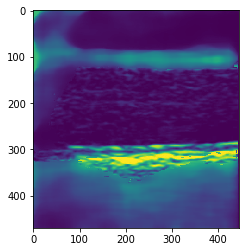

1/1 [==============================] - 6s 6s/step


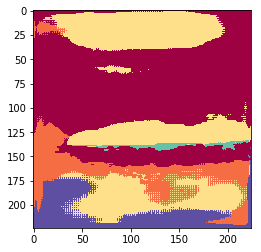

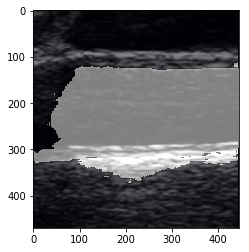

IMT Expanded 5


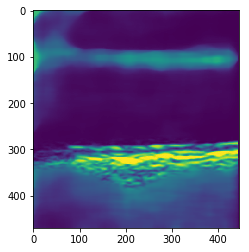

1/1 [==============================] - 6s 6s/step


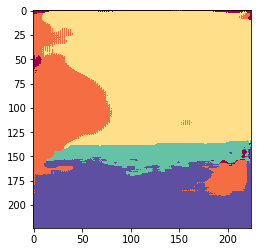

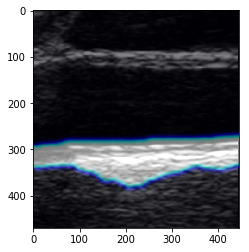

IMT Expanded 10


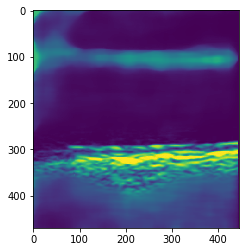

1/1 [==============================] - 6s 6s/step


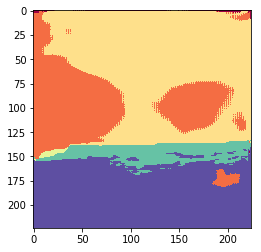

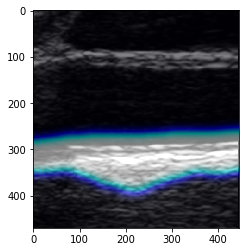

IMT Expanded 15


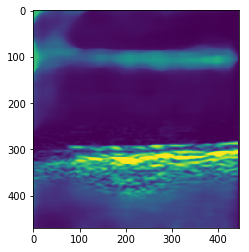

1/1 [==============================] - 6s 6s/step


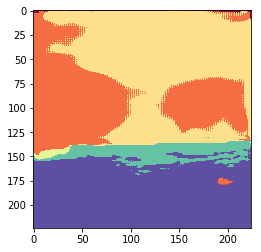

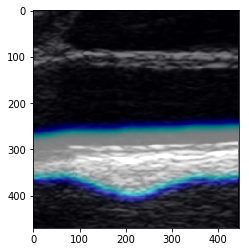

IMT Expanded 20


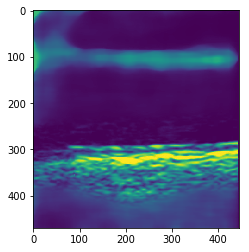

1/1 [==============================] - 6s 6s/step


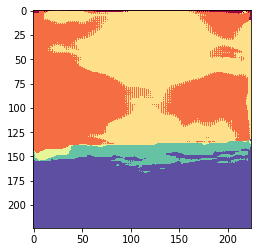

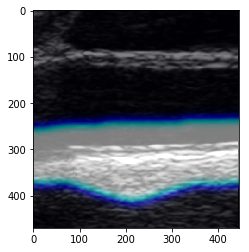

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.895368   0.770000  0.125368
1   IMT and Near Wall  2.156760   2.010000  0.146760
2    IMT and Far Wall  1.939501   1.890000  0.049501
3  IMT and Lumen Bulb  2.215959   2.090000  0.125959
4    IMT and IMT Bulb  0.895398   0.770000  0.125398
5   IMT and Lumen CCA  2.585957   2.450000  0.135957
6      IMT Expanded 5  1.072425   1.033123  0.039302
7     IMT Expanded 10  1.325986   1.274865  0.051120
8     IMT Expanded 15  1.566040   1.508791  0.057249
9     IMT Expanded 20  1.824482   1.762287  0.062196
./carotida/data/test/4TEST20.jpg
4TEST20
12
OG Segmentation:


<Figure size 432x288 with 0 Axes>

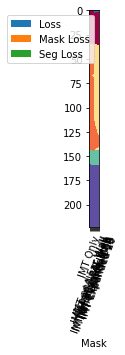

IMT Only


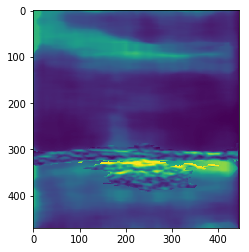

1/1 [==============================] - 6s 6s/step


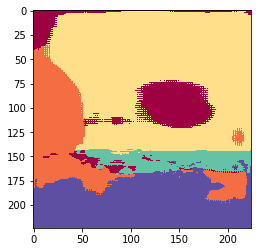

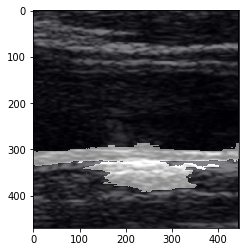

IMT and Near Wall


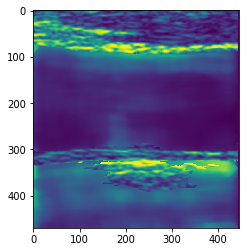

1/1 [==============================] - 6s 6s/step


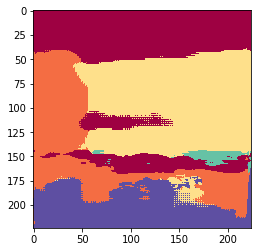

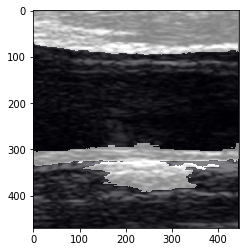

IMT and Far Wall


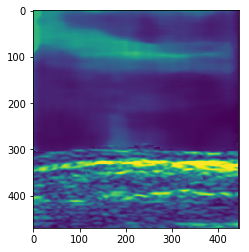

1/1 [==============================] - 6s 6s/step


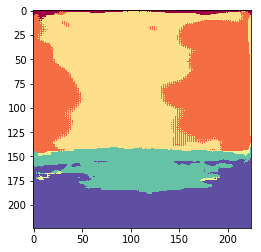

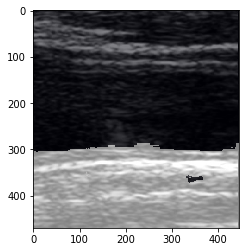

IMT and Lumen Bulb


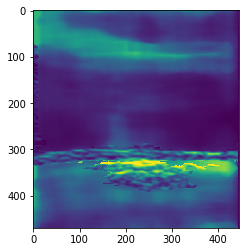

1/1 [==============================] - 6s 6s/step


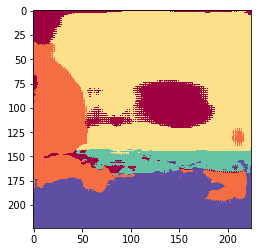

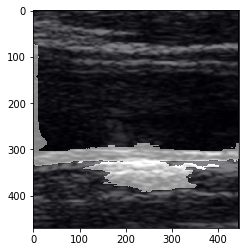

IMT and IMT Bulb


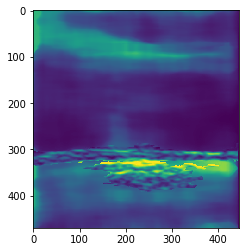

1/1 [==============================] - 6s 6s/step


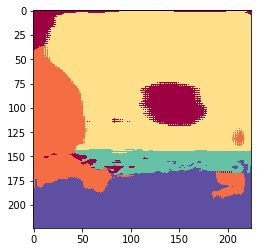

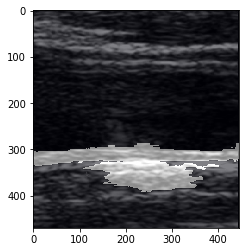

IMT and Lumen CCA


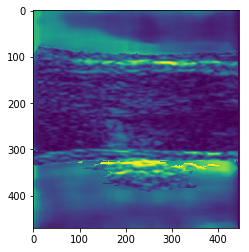

1/1 [==============================] - 6s 6s/step


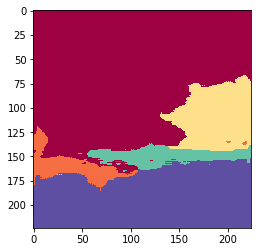

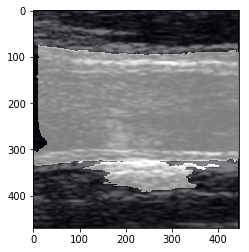

IMT Expanded 5


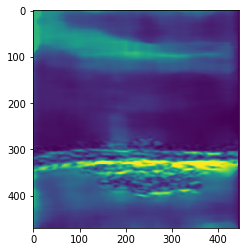

1/1 [==============================] - 7s 7s/step


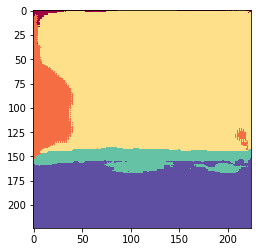

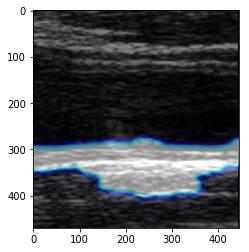

IMT Expanded 10


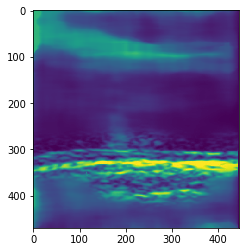

1/1 [==============================] - 6s 6s/step


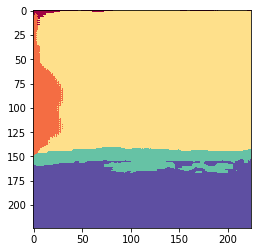

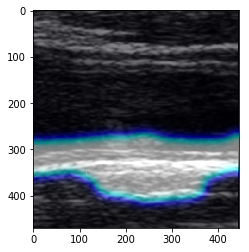

IMT Expanded 15


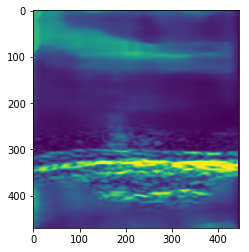

1/1 [==============================] - 6s 6s/step


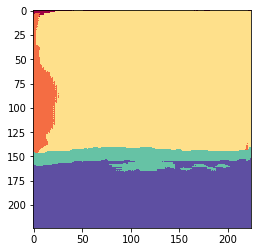

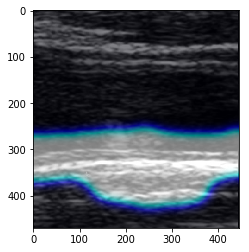

IMT Expanded 20


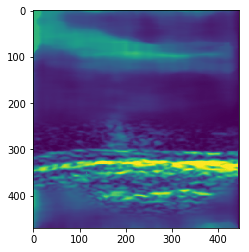

1/1 [==============================] - 6s 6s/step


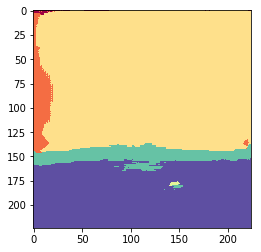

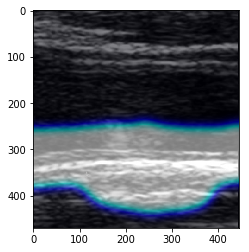

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  1.169249   1.050000  0.119249
1   IMT and Near Wall  2.211776   2.020000  0.191776
2    IMT and Far Wall  1.866971   1.830000  0.036971
3  IMT and Lumen Bulb  2.768110   2.650000  0.118110
4    IMT and IMT Bulb  1.161224   1.050000  0.111224
5   IMT and Lumen CCA  3.086460   2.980000  0.106460
6      IMT Expanded 5  1.397004   1.288915  0.108089
7     IMT Expanded 10  1.628768   1.520351  0.108416
8     IMT Expanded 15  1.865426   1.760829  0.104597
9     IMT Expanded 20  2.094978   1.999497  0.095481
./carotida/data/test/5TEST20.jpg
5TEST20
13
OG Segmentation:


<Figure size 432x288 with 0 Axes>

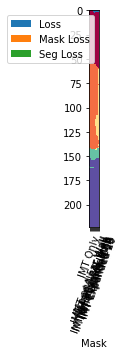

IMT Only


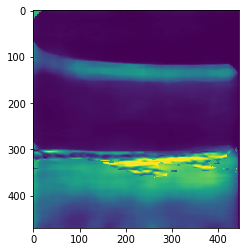

1/1 [==============================] - 6s 6s/step


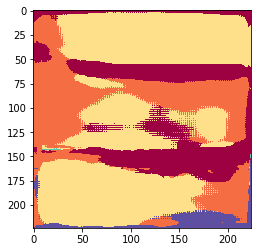

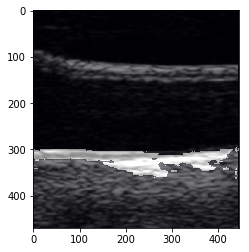

IMT and Near Wall


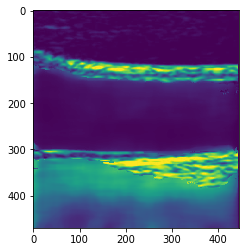

1/1 [==============================] - 6s 6s/step


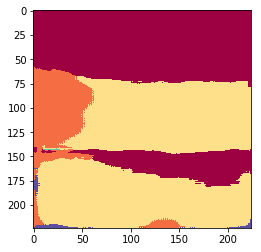

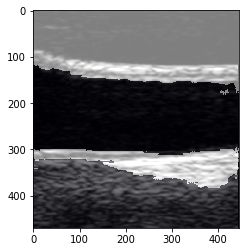

IMT and Far Wall


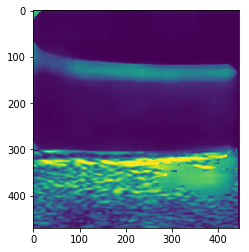

1/1 [==============================] - 6s 6s/step


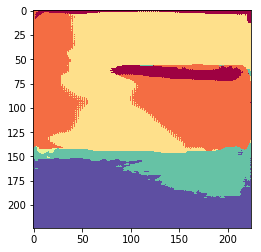

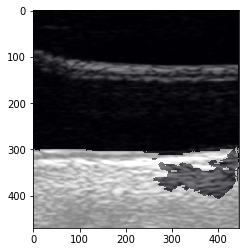

IMT and Lumen Bulb


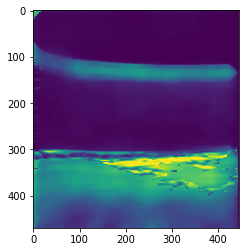

1/1 [==============================] - 6s 6s/step


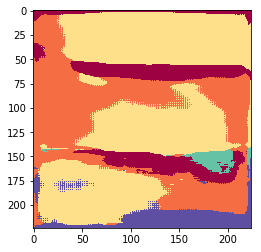

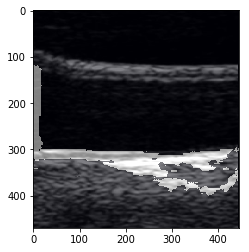

IMT and IMT Bulb


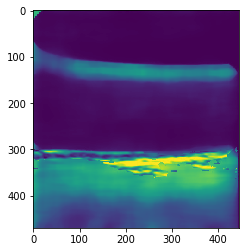

1/1 [==============================] - 6s 6s/step


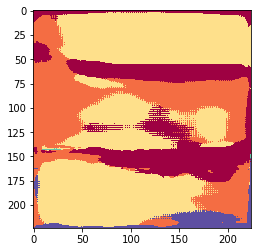

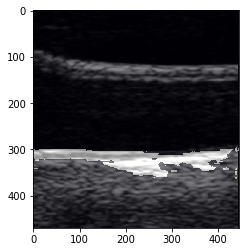

IMT and Lumen CCA


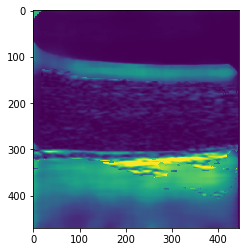

1/1 [==============================] - 6s 6s/step


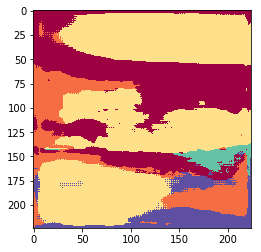

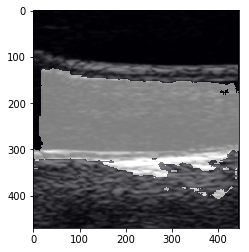

IMT Expanded 5


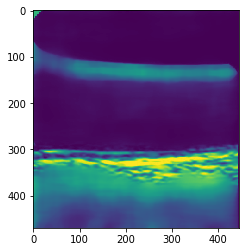

1/1 [==============================] - 6s 6s/step


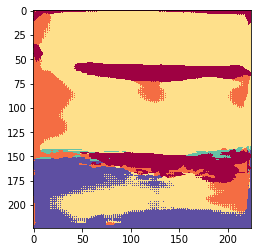

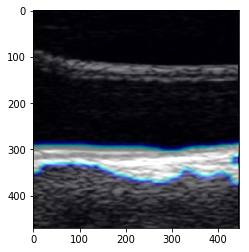

IMT Expanded 10


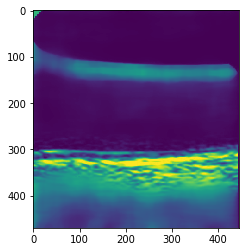

1/1 [==============================] - 6s 6s/step


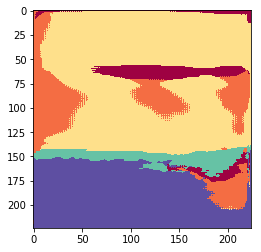

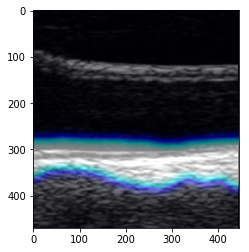

IMT Expanded 15


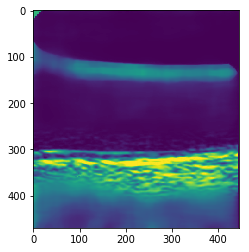

1/1 [==============================] - 6s 6s/step


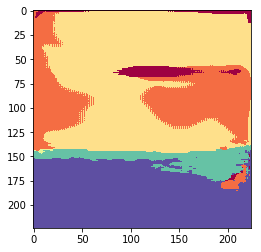

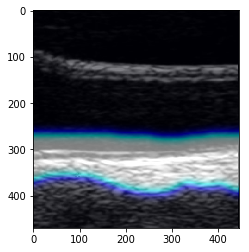

IMT Expanded 20


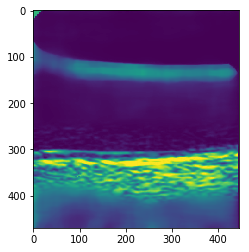

1/1 [==============================] - 6s 6s/step


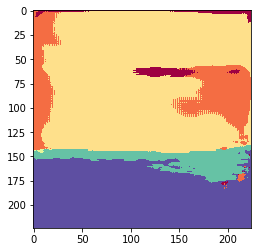

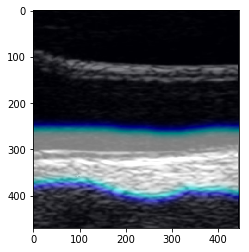

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.626012   0.530000  0.096012
1   IMT and Near Wall  2.586400   2.490000  0.096400
2    IMT and Far Wall  1.719594   1.700000  0.019594
3  IMT and Lumen Bulb  2.182747   2.090000  0.092747
4    IMT and IMT Bulb  0.626014   0.530000  0.096014
5   IMT and Lumen CCA  2.174430   2.080000  0.094430
6      IMT Expanded 5  0.865281   0.776468  0.088813
7     IMT Expanded 10  1.132062   1.089810  0.042252
8     IMT Expanded 15  1.334546   1.281235  0.053311
9     IMT Expanded 20  1.554165   1.503672  0.050492
./carotida/data/test/7TEST20.jpg
7TEST20
14
OG Segmentation:


<Figure size 432x288 with 0 Axes>

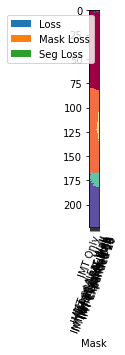

IMT Only


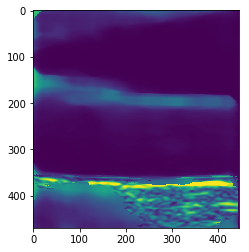

1/1 [==============================] - 6s 6s/step


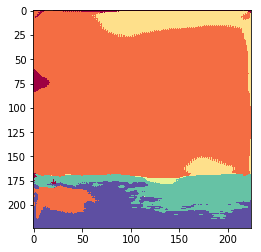

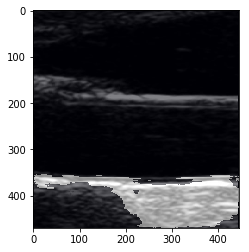

IMT and Near Wall


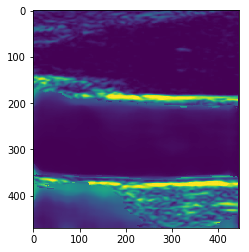

1/1 [==============================] - 6s 6s/step


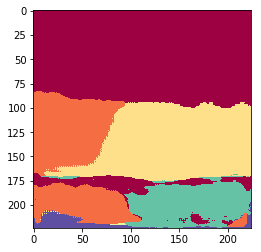

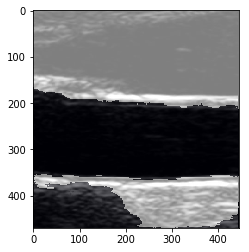

IMT and Far Wall


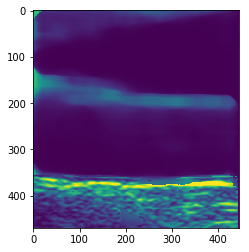

1/1 [==============================] - 6s 6s/step


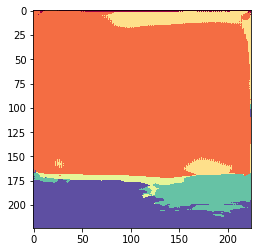

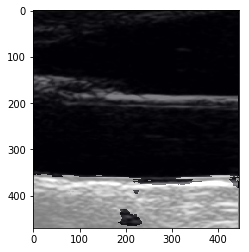

IMT and Lumen Bulb


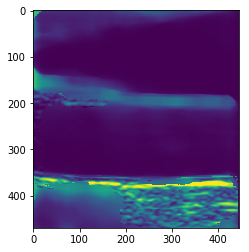

1/1 [==============================] - 6s 6s/step


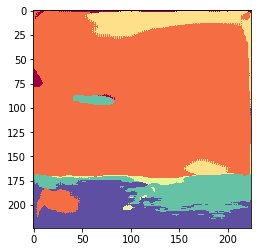

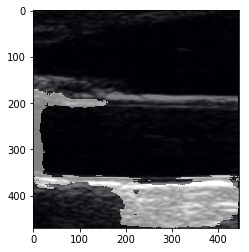

IMT and IMT Bulb


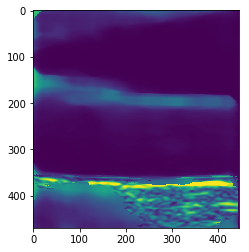

1/1 [==============================] - 6s 6s/step


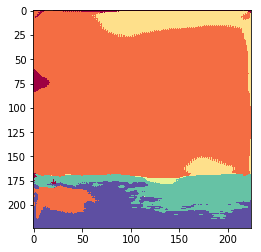

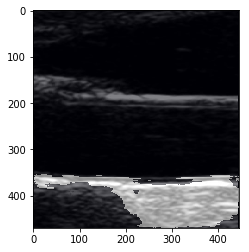

IMT and Lumen CCA


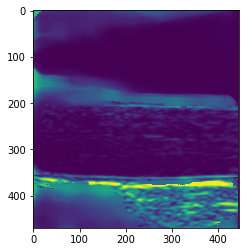

1/1 [==============================] - 6s 6s/step


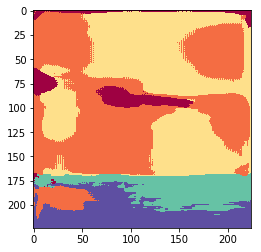

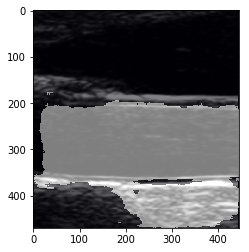

IMT Expanded 5


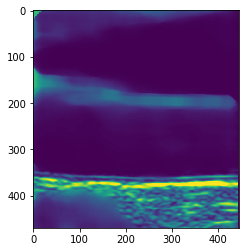

1/1 [==============================] - 6s 6s/step


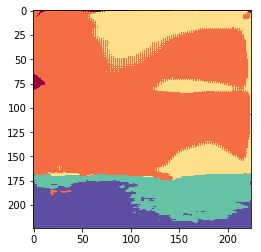

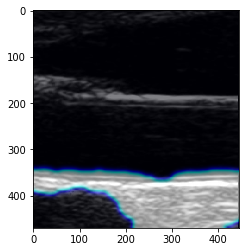

IMT Expanded 10


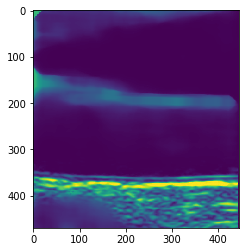

1/1 [==============================] - 6s 6s/step


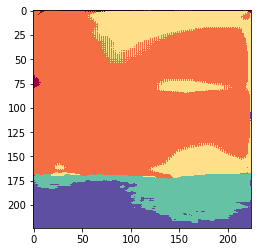

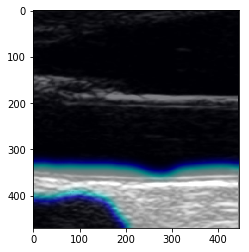

IMT Expanded 15


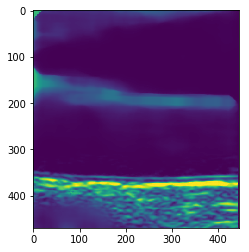

1/1 [==============================] - 6s 6s/step


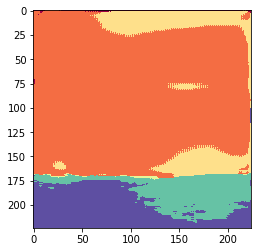

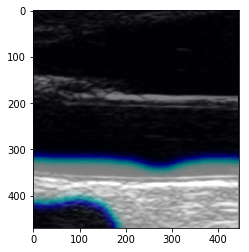

IMT Expanded 20


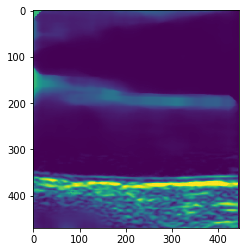

1/1 [==============================] - 6s 6s/step


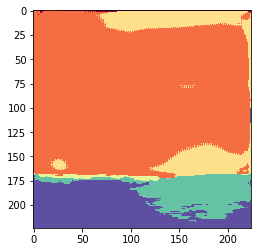

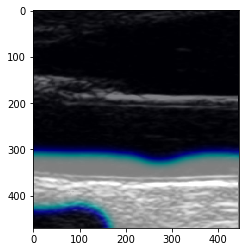

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  1.245250   1.130000  0.115250
1   IMT and Near Wall  3.319592   3.250000  0.069592
2    IMT and Far Wall  1.322843   1.170000  0.152843
3  IMT and Lumen Bulb  2.226304   2.100000  0.126304
4    IMT and IMT Bulb  1.245250   1.130000  0.115250
5   IMT and Lumen CCA  2.749665   2.650000  0.099665
6      IMT Expanded 5  1.347892   1.269959  0.077933
7     IMT Expanded 10  1.470617   1.389656  0.080961
8     IMT Expanded 15  1.608654   1.509974  0.098680
9     IMT Expanded 20  1.743309   1.629983  0.113326
./carotida/data/test/9TEST20.jpg
9TEST20
15
OG Segmentation:


<Figure size 432x288 with 0 Axes>

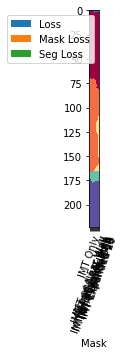

IMT Only


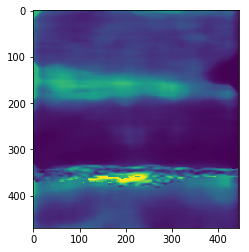

1/1 [==============================] - 6s 6s/step


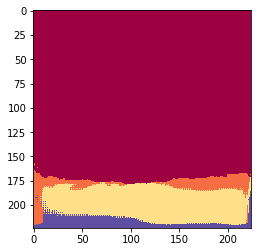

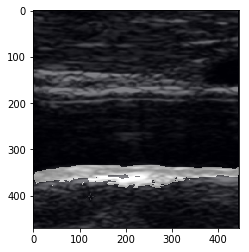

IMT and Near Wall


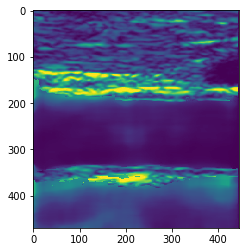

1/1 [==============================] - 6s 6s/step


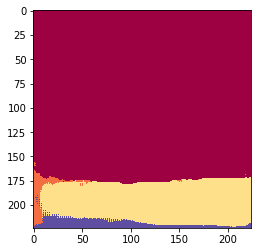

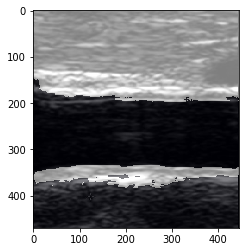

IMT and Far Wall


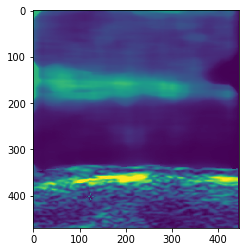

1/1 [==============================] - 7s 7s/step


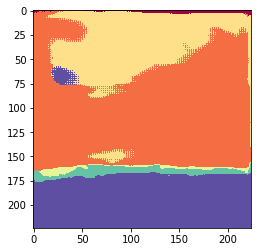

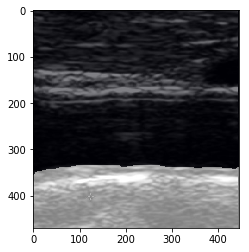

IMT and Lumen Bulb


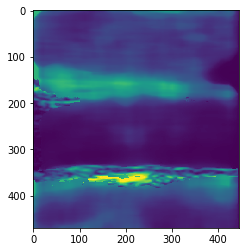

1/1 [==============================] - 6s 6s/step


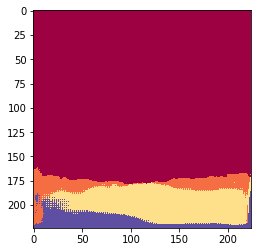

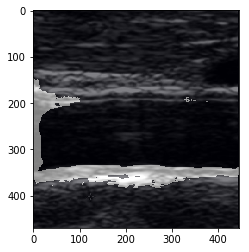

IMT and IMT Bulb


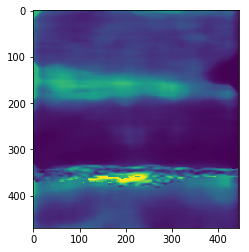

1/1 [==============================] - 6s 6s/step


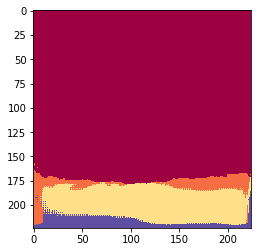

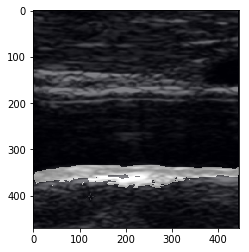

IMT and Lumen CCA


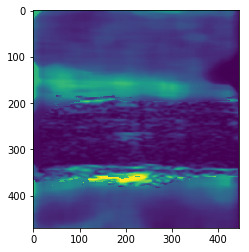

1/1 [==============================] - 6s 6s/step


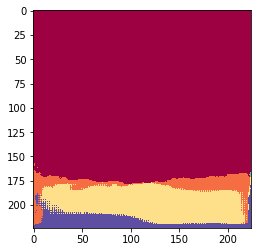

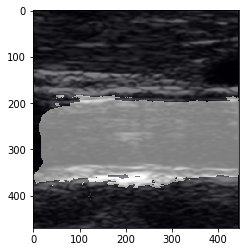

IMT Expanded 5


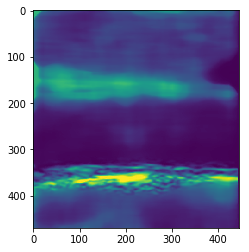

1/1 [==============================] - 6s 6s/step


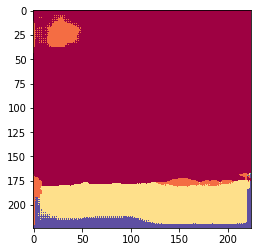

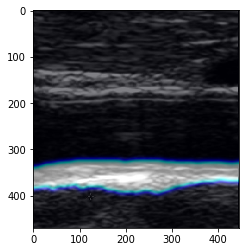

IMT Expanded 10


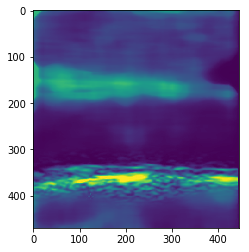

1/1 [==============================] - 6s 6s/step


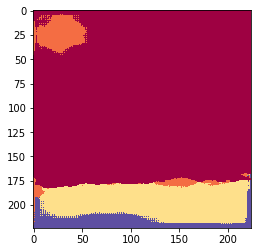

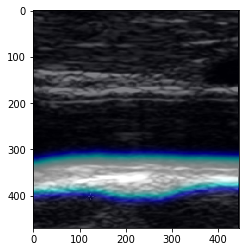

IMT Expanded 15


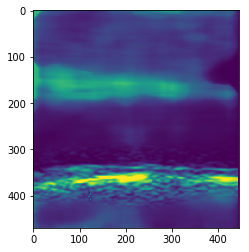

1/1 [==============================] - 6s 6s/step


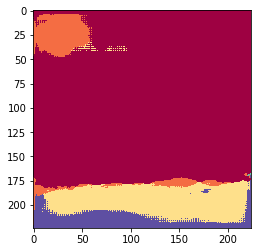

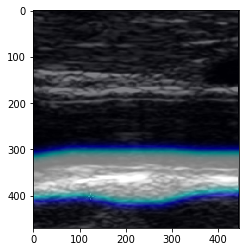

IMT Expanded 20


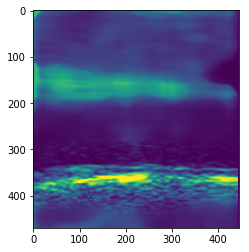

1/1 [==============================] - 6s 6s/step


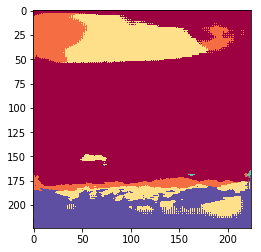

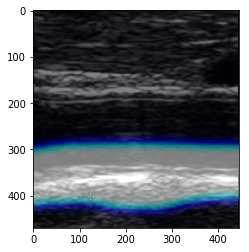

                 Mask      Loss  Mask Loss  Seg Loss
0            IMT Only  0.590429   0.500000  0.090429
1   IMT and Near Wall  2.560452   2.470000  0.090452
2    IMT and Far Wall  1.408606   1.360000  0.048606
3  IMT and Lumen Bulb  2.340425   2.250000  0.090425
4    IMT and IMT Bulb  0.590429   0.500000  0.090429
5   IMT and Lumen CCA  1.960428   1.870000  0.090428
6      IMT Expanded 5  0.825925   0.735498  0.090427
7     IMT Expanded 10  1.058075   0.967676  0.090399
8     IMT Expanded 15  1.294215   1.203845  0.090370
9     IMT Expanded 20  1.549755   1.459978  0.089777


<Figure size 432x288 with 0 Axes>

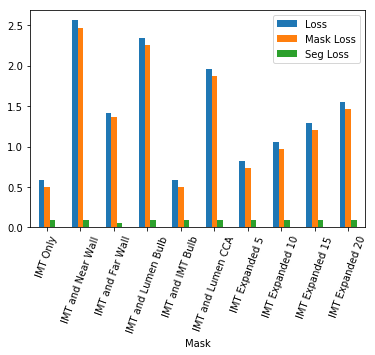

In [172]:
for i, name in enumerate(test_list):
    img_name = name.strip().replace('/data/test/', '').replace('.jpg', '')
    img_path = './carotida/data/test/'+img_name+'.jpg'
    p1 = pred_net['test'][i]
    
    print(img_path)
    print(img_name)
    print(i)
    
    diagnose_image(p1, img_path, img_name)